**Title:**   
## Multiple_Stock_Trading_Strategies



### Time Series Analysis and Forecasting

Time series analysis and forecasting is a technique for the prediction of events through a sequence of time. It predicts future events by analyzing the trends of the past, on the assumption that future trends will hold similar to historical trends.

The goal is to apply a single trading strategy to multiple stocks
and compare the performance across these stocks and apply a trading strategy based on the time series concepts

### 1. Dataset Preparation

Let's start by loading the dataset and getting a brief overview of its contents.

Import libraries used to download financial data from Yahoo Finance.

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
import plotly.graph_objects as go

import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

In [ ]:
# List of stock tickers you want to download
tickers = ['NVDA', 'AAPL', 'GOOGL', 'MSFT', 'AMZN', 'TSLA']

# Download data for the specified tickers
data = yf.download(tickers, start='2010-01-01', end='2025-01-21', auto_adjust=False)

# Display the downloaded data
print(data.head(n=5))

[*********************100%***********************]  6 of 6 completed

Price      Adj Close                                                  Close  \
Ticker          AAPL    AMZN      GOOGL       MSFT      NVDA TSLA      AAPL   
Date                                                                          
2010-01-04  6.447412  6.6950  15.627782  23.300682  0.423923  NaN  7.643214   
2010-01-05  6.458559  6.7345  15.558963  23.308210  0.430113  NaN  7.656429   
2010-01-06  6.355826  6.6125  15.166740  23.165171  0.432864  NaN  7.534643   
2010-01-07  6.344079  6.5000  14.813666  22.924250  0.424381  NaN  7.520714   
2010-01-08  6.386255  6.6760  15.011149  23.082346  0.425298  NaN  7.570714   

Price                                     ...       Open                      \
Ticker        AMZN      GOOGL       MSFT  ...      GOOGL       MSFT     NVDA   
Date                                      ...                                  
2010-01-04  6.6950  15.684434  30.950001  ...  15.689439  30.620001  0.46275   
2010-01-05  6.7345  15.615365  30.959999  ...  

Create 'tickers' that contains the stock symbols for multiple stocks from well known companies:

NVDA: NVIDIA Corporation
AAPL: Apple Inc.
GOOGL: Alphabet Inc. (Google)
MSFT: Microsoft Corporation
AMZN: Amazon.com, Inc.
TSLA: Tesla, Inc.

Then fetch historical stock price data for the specified tickers from 1st January 2010 to 21st January 2025 from Yahoo Finance and print the first 5 rows of that data.

The result is stored in the variable data, which will typically be a Pandas DataFrame containing the historical stock prices, including open, high, low, close prices, volume, and adjusted close prices for each ticker.


## Data Preprocessing

Clean the data by removing any missing values

In [ ]:
data.head(n=5)

Price      Adj Close                                                  Close  \
Ticker          AAPL    AMZN      GOOGL       MSFT      NVDA TSLA      AAPL   
Date                                                                          
2010-01-04  6.447412  6.6950  15.627782  23.300682  0.423923  NaN  7.643214   
2010-01-05  6.458559  6.7345  15.558963  23.308210  0.430113  NaN  7.656429   
2010-01-06  6.355826  6.6125  15.166740  23.165171  0.432864  NaN  7.534643   
2010-01-07  6.344079  6.5000  14.813666  22.924250  0.424381  NaN  7.520714   
2010-01-08  6.386255  6.6760  15.011149  23.082346  0.425298  NaN  7.570714   

Price                                     ...       Open                      \
Ticker        AMZN      GOOGL       MSFT  ...      GOOGL       MSFT     NVDA   
Date                                      ...                                  
2010-01-04  6.6950  15.684434  30.950001  ...  15.689439  30.620001  0.46275   
2010-01-05  6.7345  15.615365  30.959999  ...  15.695195  30.850000  0.46050   
2010-01-06  6.6125  15.221722  30.770000  ...  15.662162  30.879999  0.46875   
2010-01-07  6.5000  14.867367  30.450001  ...  15.250250  30.629999  0.46950   
2010-01-08  6.6760  15.065566  30.660000  ...  14.814815  30.280001  0.45900   

Price               Volume                                                  
Ticker     TSLA       AAPL       AMZN      GOOGL      MSFT       NVDA TSLA  
Date                                                                        
2010-01-04  NaN  493729600  151998000   78169752  38409100  800204000  NaN  
2010-01-05  NaN  601904800  177038000  120067812  49749600  728648000  NaN  
2010-01-06  NaN  552160000  143576000  158988852  58182400  649168000  NaN  
2010-01-07  NaN  477131200  220604000  256315428  50559700  547792000  NaN  
2010-01-08  NaN  447610800  196610000  188783028  51197400  478168000  NaN  

[5 rows x 36 columns]

In [ ]:
data.columns

MultiIndex([('Adj Close',  'AAPL'),
            ('Adj Close',  'AMZN'),
            ('Adj Close', 'GOOGL'),
            ('Adj Close',  'MSFT'),
            ('Adj Close',  'NVDA'),
            ('Adj Close',  'TSLA'),
            (    'Close',  'AAPL'),
            (    'Close',  'AMZN'),
            (    'Close', 'GOOGL'),
            (    'Close',  'MSFT'),
            (    'Close',  'NVDA'),
            (    'Close',  'TSLA'),
            (     'High',  'AAPL'),
            (     'High',  'AMZN'),
            (     'High', 'GOOGL'),
            (     'High',  'MSFT'),
            (     'High',  'NVDA'),
            (     'High',  'TSLA'),
            (      'Low',  'AAPL'),
            (      'Low',  'AMZN'),
            (      'Low', 'GOOGL'),
            (      'Low',  'MSFT'),
            (      'Low',  'NVDA'),
            (      'Low',  'TSLA'),
            (     'Open',  'AAPL'),
            (     'Open',  'AMZN'),
            (     'Open', 'GOOGL'),
            (     'Open',  '

In [ ]:
data.shape

(3785, 36)

In [ ]:
# Get unique values from the first level of the columns (assuming it contains the tickers)
unique_tickers = data.columns.get_level_values(0).unique()

# Display the unique tickers
print(unique_tickers)

Index(['Adj Close', 'Close', 'High', 'Low', 'Open', 'Volume'], dtype='object', name='Price')


Ensuring that timestamps are consistent.

In [ ]:
# Assuming 'Date' is in the index, reset the index to make it a column
data = data.reset_index()

# Now you can convert the 'Date' column to datetime
data['Date'] = pd.to_datetime(data['Date'])

In [ ]:
data['Date'][0]

Timestamp('2010-01-04 00:00:00')

In [ ]:
data.head()

Price        Date Adj Close                                               \
Ticker                 AAPL    AMZN      GOOGL       MSFT      NVDA TSLA   
0      2010-01-04  6.447412  6.6950  15.627782  23.300682  0.423923  NaN   
1      2010-01-05  6.458559  6.7345  15.558963  23.308210  0.430113  NaN   
2      2010-01-06  6.355826  6.6125  15.166740  23.165171  0.432864  NaN   
3      2010-01-07  6.344079  6.5000  14.813666  22.924250  0.424381  NaN   
4      2010-01-08  6.386255  6.6760  15.011149  23.082346  0.425298  NaN   

Price      Close                     ...       Open                           \
Ticker      AAPL    AMZN      GOOGL  ...      GOOGL       MSFT     NVDA TSLA   
0       7.643214  6.6950  15.684434  ...  15.689439  30.620001  0.46275  NaN   
1       7.656429  6.7345  15.615365  ...  15.695195  30.850000  0.46050  NaN   
2       7.534643  6.6125  15.221722  ...  15.662162  30.879999  0.46875  NaN   
3       7.520714  6.5000  14.867367  ...  15.250250  30.629999  0.46950  NaN   
4       7.570714  6.6760  15.065566  ...  14.814815  30.280001  0.45900  NaN   

Price      Volume                                                  
Ticker       AAPL       AMZN      GOOGL      MSFT       NVDA TSLA  
0       493729600  151998000   78169752  38409100  800204000  NaN  
1       601904800  177038000  120067812  49749600  728648000  NaN  
2       552160000  143576000  158988852  58182400  649168000  NaN  
3       477131200  220604000  256315428  50559700  547792000  NaN  
4       447610800  196610000  188783028  51197400  478168000  NaN  

[5 rows x 37 columns]

In [ ]:
# Check for missing values
data.isnull().sum()

Price      Ticker
Date                   0
Adj Close  AAPL        0
           AMZN        0
           GOOGL       0
           MSFT        0
           NVDA        0
           TSLA      122
Close      AAPL        0
           AMZN        0
           GOOGL       0
           MSFT        0
           NVDA        0
           TSLA      122
High       AAPL        0
           AMZN        0
           GOOGL       0
           MSFT        0
           NVDA        0
           TSLA      122
Low        AAPL        0
           AMZN        0
           GOOGL       0
           MSFT        0
           NVDA        0
           TSLA      122
Open       AAPL        0
           AMZN        0
           GOOGL       0
           MSFT        0
           NVDA        0
           TSLA      122
Volume     AAPL        0
           AMZN        0
           GOOGL       0
           MSFT        0
           NVDA        0
           TSLA      122
dtype: int64

In [ ]:
# Fill missing values using forward fill for 'Open', 'High', 'Low', 'Close', 'Adj Close' for TSLA
for col in ['Open', 'High', 'Low', 'Close', 'Adj Close']:
    # Use a tuple to access MultiIndex columns and specify 'TSLA'
    data[(col, 'TSLA')] = data[(col, 'TSLA')].fillna(method='ffill').fillna(method='bfill')

# Fill missing values using forward fill for 'Volume' for TSLA
# Use a tuple to access MultiIndex columns and specify 'TSLA'
data[('Volume', 'TSLA')] = data[('Volume', 'TSLA')].fillna(method='ffill').fillna(method='bfill')


In [ ]:
# Check for missing values
data.count()

Price      Ticker
Date                 3785
Adj Close  AAPL      3785
           AMZN      3785
           GOOGL     3785
           MSFT      3785
           NVDA      3785
           TSLA      3785
Close      AAPL      3785
           AMZN      3785
           GOOGL     3785
           MSFT      3785
           NVDA      3785
           TSLA      3785
High       AAPL      3785
           AMZN      3785
           GOOGL     3785
           MSFT      3785
           NVDA      3785
           TSLA      3785
Low        AAPL      3785
           AMZN      3785
           GOOGL     3785
           MSFT      3785
           NVDA      3785
           TSLA      3785
Open       AAPL      3785
           AMZN      3785
           GOOGL     3785
           MSFT      3785
           NVDA      3785
           TSLA      3785
Volume     AAPL      3785
           AMZN      3785
           GOOGL     3785
           MSFT      3785
           NVDA      3785
           TSLA      3785
dtype: int64

### 1. Descriptive Statistics    

It refers to a set of methods used to summarize and describe the main features of a dataset, such as its central tendency, variability, and distribution.


In [ ]:
# Summary Statistics
summary_stats = data.describe()
print("Summary Statistics:\n", summary_stats)

Summary Statistics:
 Price                            Date    Adj Close                            \
Ticker                                        AAPL         AMZN        GOOGL   
count                            3785  3785.000000  3785.000000  3785.000000   
mean    2017-07-09 21:27:49.220607488    68.091096    71.882218    61.603631   
min               2010-01-04 00:00:00     5.785831     5.430500    10.873247   
25%               2013-10-07 00:00:00    17.502516    15.018000    22.670071   
50%               2017-07-11 00:00:00    35.637806    48.577000    47.342381   
75%               2021-04-14 00:00:00   127.998207   121.660004    94.268265   
max               2025-01-17 00:00:00   259.019989   232.929993   196.869995   
std                               NaN    66.218409    61.570875    47.162307   

Price                                                Close               \
Ticker         MSFT         NVDA         TSLA         AAPL         AMZN   
count   3785.000000  3785.00

In [ ]:
# rename the column
data.rename(columns={'Adj Close':'Adj_Close'}, inplace=True)

In [ ]:
# Calculate the daily returns for each ticker
for ticker in tickers:
    # Access data for the specific ticker using a tuple for MultiIndex columns
    data[('Returns', ticker)] = data[('Adj_Close', ticker)].pct_change()

# Display the updated DataFrame with daily returns
print("DataFrame with Daily Returns:")
print(data.head(5))


DataFrame with Daily Returns:
Price        Date Adj_Close                                                    \
Ticker                 AAPL    AMZN      GOOGL       MSFT      NVDA      TSLA   
0      2010-01-04  6.447412  6.6950  15.627782  23.300682  0.423923  1.592667   
1      2010-01-05  6.458559  6.7345  15.558963  23.308210  0.430113  1.592667   
2      2010-01-06  6.355826  6.6125  15.166740  23.165171  0.432864  1.592667   
3      2010-01-07  6.344079  6.5000  14.813666  22.924250  0.424381  1.592667   
4      2010-01-08  6.386255  6.6760  15.011149  23.082346  0.425298  1.592667   

Price      Close                     ...     Volume                       \
Ticker      AAPL    AMZN      GOOGL  ...      GOOGL      MSFT       NVDA   
0       7.643214  6.6950  15.684434  ...   78169752  38409100  800204000   
1       7.656429  6.7345  15.615365  ...  120067812  49749600  728648000   
2       7.534643  6.6125  15.221722  ...  158988852  58182400  649168000   
3       7.520714  6.50

In [ ]:
# Initialize an empty list to hold the descriptive statistics
descriptive_stats = []

# Loop through each ticker and get the descriptive statistics
for ticker in tickers:
    # Access data using a tuple (column_level_1, column_level_2)
    ticker_data = data[('Adj_Close', ticker)]
    stats = ticker_data.describe()
    stats.name = ticker  # Set the name of the Series to the ticker
    descriptive_stats.append(stats)

# Concatenate the descriptive statistics into a single DataFrame
comparison_df = pd.concat(descriptive_stats, axis=1)

# Display the comparison of descriptive statistics
print(comparison_df)

              NVDA         AAPL        GOOGL         MSFT         AMZN  \
count  3785.000000  3785.000000  3785.000000  3785.000000  3785.000000   
mean     14.340078    68.091096    61.603631   130.688915    71.882218   
std      28.838244    66.218409    47.162307   126.045795    61.570875   
min       0.203593     5.785831    10.873247    17.482592     5.430500   
25%       0.413605    17.502516    22.670071    28.854601    15.018000   
50%       3.564127    35.637806    47.342381    65.977730    48.577000   
75%      13.629661   127.998207    94.268265   230.743225   121.660004   
max     149.429993   259.019989   196.869995   465.786438   232.929993   

              TSLA  
count  3785.000000  
mean     79.887640  
std     108.086031  
min       1.053333  
25%       9.862667  
50%      17.433332  
75%     174.839996  
max     479.859985  


**Similar Data Point Count:** All companies have the same count (3785), suggesting a consistent data collection period.

**Tesla (TSLA) Outlier:** Tesla's data stands out with a much higher mean and max price, suggesting a significantly higher stock value compared to other companies.

**Volatility:** Stocks like NVDA and TSLA have a high standard deviation compared to others, suggests greater price fluctuations, which may imply higher risk (higher volatility). This means their prices fluctuate more dramatically than those of companies like AAPL and GOOGL.

**Price Range:** MSFT has a much larger price range than the other stocks, as its maximum value is far greater than the rest. This indicates a skewed distribution, suggesting that some stocks have extreme values affecting the average. This suggests MSFT experiences more significant price swings.

**Median vs. Mean:** For most stocks, the mean is higher than the median. This indicates a right-skewed distribution, meaning there are more extreme values on the higher end of the price range. For example, NVDA(14.340078) has a mean price significantly lower than GOOGL(61.603631), it may indicate differing investor sentiment or market conditions.

**Relative Performance:** The mean value of MSFT is significantly higher than the other stocks, followed by AMZN, suggesting higher average performance. and the mean stock prices reveal which companies are currently valued higher in the market rating MSFT(130.688916) highest and NVDA lowest.



## Extracting year, month and day

In [ ]:
# Convert 'Date' to datetime if not already done
data['Date'] = pd.to_datetime(data['Date'])

# Set 'Date' column as the index
data = data.set_index('Date')

# Now you can extract year, month, and day
data['Year'] = data.index.year
data['Month'] = data.index.month
data['Day'] = data.index.day

print(f"\nDataFrame with extracted date components:")
print(data.head())


DataFrame with extracted date components:
Price      Adj_Close                                                    \
Ticker          AAPL    AMZN      GOOGL       MSFT      NVDA      TSLA   
Date                                                                     
2010-01-04  6.447412  6.6950  15.627782  23.300682  0.423923  1.592667   
2010-01-05  6.458559  6.7345  15.558963  23.308210  0.430113  1.592667   
2010-01-06  6.355826  6.6125  15.166740  23.165171  0.432864  1.592667   
2010-01-07  6.344079  6.5000  14.813666  22.924250  0.424381  1.592667   
2010-01-08  6.386255  6.6760  15.011149  23.082346  0.425298  1.592667   

Price          Close                                ...       Volume  \
Ticker          AAPL    AMZN      GOOGL       MSFT  ...         TSLA   
Date                                                ...                
2010-01-04  7.643214  6.6950  15.684434  30.950001  ...  281494500.0   
2010-01-05  7.656429  6.7345  15.615365  30.959999  ...  281494500.0   
2010

## Analysis of the stocks

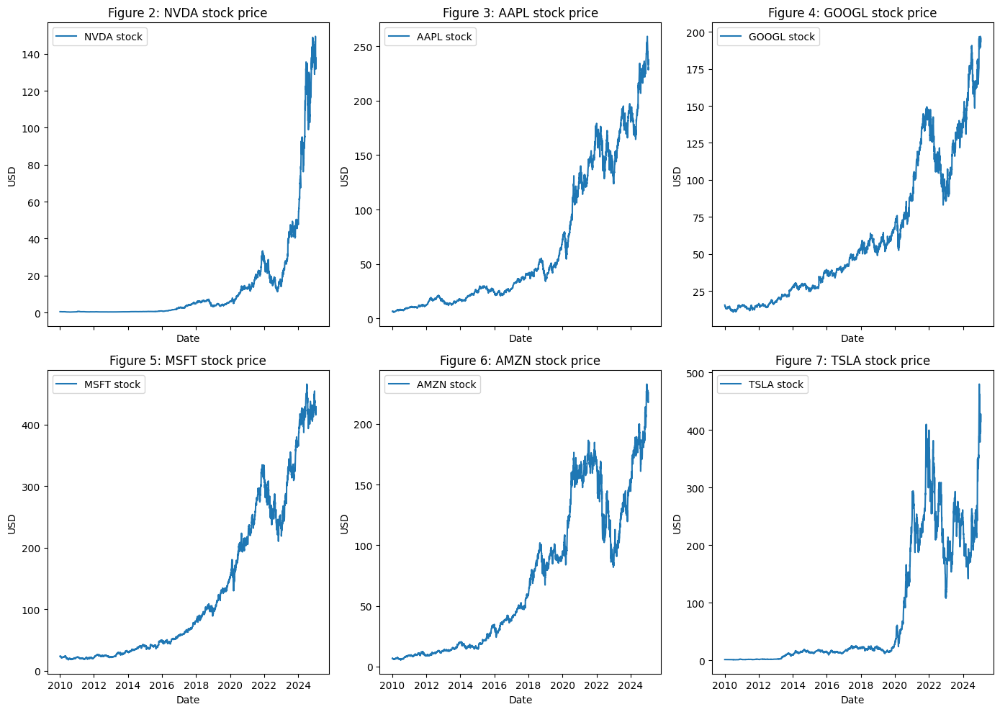

In [ ]:
# Create a subplot for each ticker in a 2x3 grid
fig, axes = plt.subplots(2, 3, figsize=(14, 5 * 2), dpi=100, sharex=True)  # 2 rows, 3 columns

# Iterate through tickers and plot each on a separate subplot
for i, ticker in enumerate(tickers):
    row = i // 3  # Calculate the row index
    col = i % 3   # Calculate the column index
    ax = axes[row, col]  # Get the current subplot using row and column indices

    # Use the index of the DataFrame for x-axis values
    x_values = data.index

    ax.plot(x_values, data[('Adj_Close', ticker)], label=f'{ticker} stock')
    ax.set_xlabel('Date')
    ax.set_ylabel('USD')
    ax.set_title(f'Figure {i+2}: {ticker} stock price')
    ax.legend()

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

This is a visualize the stock for the last fourteen years. The resulting figure provides a visual representation of the stock price trends for the selected tickers.

## Calculate and Visualize the Correlation Between the Stocks

### Analyse closing price of all the stocks

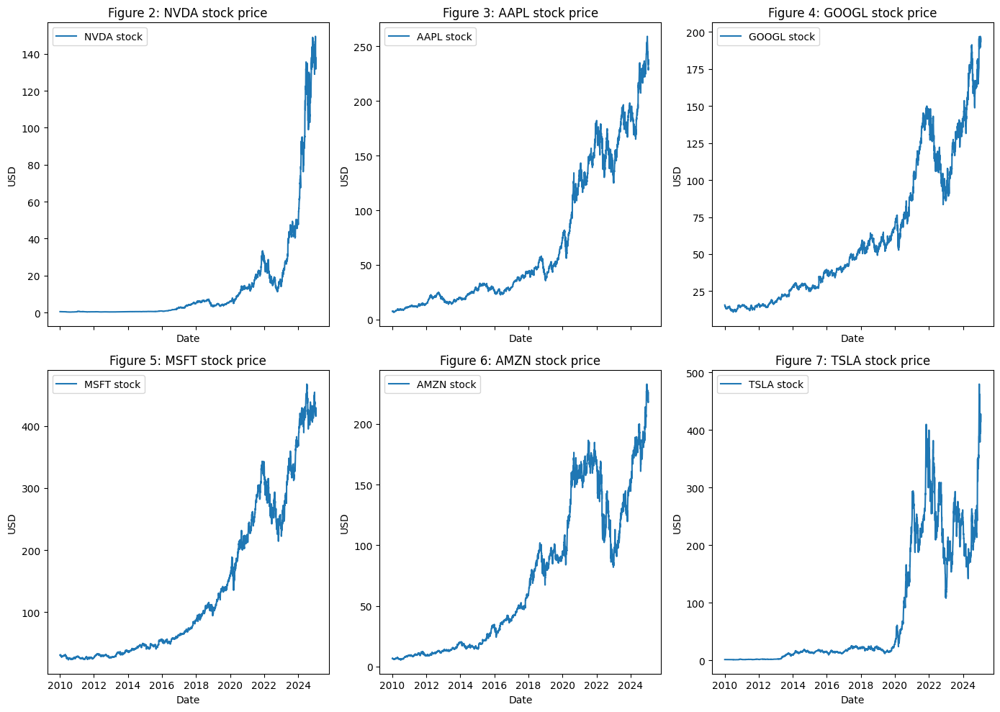

In [ ]:
# Create a subplot for each ticker in a 2x3 grid
fig, axes = plt.subplots(2, 3, figsize=(14, 5 * 2), dpi=100, sharex=True)  # 2 rows, 3 columns

# Iterate through tickers and plot each on a separate subplot
for i, ticker in enumerate(tickers):
    row = i // 3  # Calculate the row index
    col = i % 3   # Calculate the column index
    ax = axes[row, col]  # Get the current subplot using row and column indices

    # Use the index of the DataFrame for x-axis values
    x_values = data.index  # Use data.index to get the DatetimeIndex

    ax.plot(x_values, data[('Close', ticker)], label=f'{ticker} stock')
    ax.set_xlabel('Date')
    ax.set_ylabel('USD')
    ax.set_title(f'Figure {i+2}: {ticker} stock price')
    ax.legend()

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

### Analyse closing price versus adjusted closing price for all tickers

                NVDA      AAPL     GOOGL      MSFT  AMZN  TSLA
Date                                                          
2010-01-04  0.038327  1.195803  0.056652  7.649319   0.0   0.0
2010-01-05  0.038887  1.197870  0.056402  7.651789   0.0   0.0
2010-01-06  0.039136  1.178817  0.054981  7.604830   0.0   0.0
2010-01-07  0.038369  1.176635  0.053700  7.525751   0.0   0.0
2010-01-08  0.038452  1.184459  0.054417  7.577654   0.0   0.0
...              ...       ...       ...       ...   ...   ...
2025-01-13  0.000000  0.000000  0.000000  0.000000   0.0   0.0
2025-01-14  0.000000  0.000000  0.000000  0.000000   0.0   0.0
2025-01-15  0.000000  0.000000  0.000000  0.000000   0.0   0.0
2025-01-16  0.000000  0.000000  0.000000  0.000000   0.0   0.0
2025-01-17  0.000000  0.000000  0.000000  0.000000   0.0   0.0

[3785 rows x 6 columns]


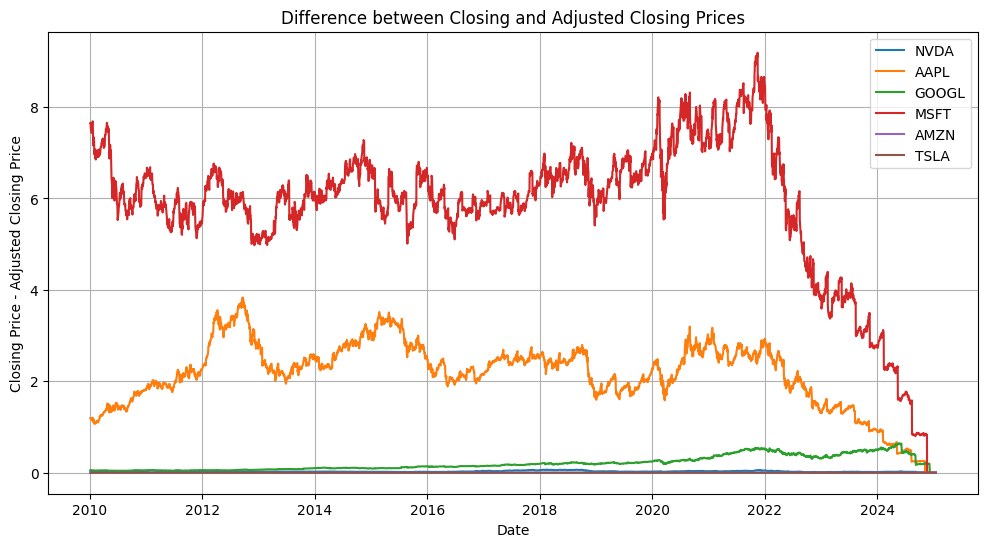

In [ ]:
# Create a new DataFrame to store the difference between 'Close' and 'Adj Close'
price_compare = pd.DataFrame()

# Loop through each ticker
for ticker in tickers:
    # Calculate the difference
    price_compare[ticker] = data[('Close', ticker)] - data[('Adj_Close', ticker)]

# Display or further analyze the price_diff DataFrame
print(price_compare)

# Visualization (optional):  Plot the difference for each ticker
plt.figure(figsize=(12, 6))
for ticker in tickers:
    # Use data.index to access the dates (which are now in the index)
    plt.plot(data.index, price_compare[ticker], label=ticker)
plt.xlabel('Date')
plt.ylabel('Closing Price - Adjusted Closing Price')
plt.title('Difference between Closing and Adjusted Closing Prices')
plt.legend()
plt.grid(True)
plt.show()


**Trends:**- The graph shows that the difference between closing price and adjusted closing price generally increases over time for most companies. There are periods where the difference decreases or remains stable, but the overall trend is upwards.

The difference for MSFT is consistently greater than the other companies, indicating a larger influence of stock splits, dividends, or other corporate actions on its price.

The difference for TSLA shows a significant increase after 2020, indicating a possible impact of corporate actions or market events during that period.

### Analyse the total volume of stock being traded each day

Price          Volume                                                        
Ticker           NVDA       AAPL      GOOGL      MSFT       AMZN         TSLA
Date                                                                         
2010-01-04  800204000  493729600   78169752  38409100  151998000  281494500.0
2010-01-05  728648000  601904800  120067812  49749600  177038000  281494500.0
2010-01-06  649168000  552160000  158988852  58182400  143576000  281494500.0
2010-01-07  547792000  477131200  256315428  50559700  220604000  281494500.0
2010-01-08  478168000  447610800  188783028  51197400  196610000  281494500.0
...               ...        ...        ...       ...        ...          ...
2025-01-13  204808900   49630700   21823700  17604800   27262700   67580500.0
2025-01-14  195590500   39435300   17174900  16935900   24711700   84565000.0
2025-01-15  185217300   39832000   21776000  19637800   31291300   81375500.0
2025-01-16  209235600   71759100   17815400  15300000   24757300

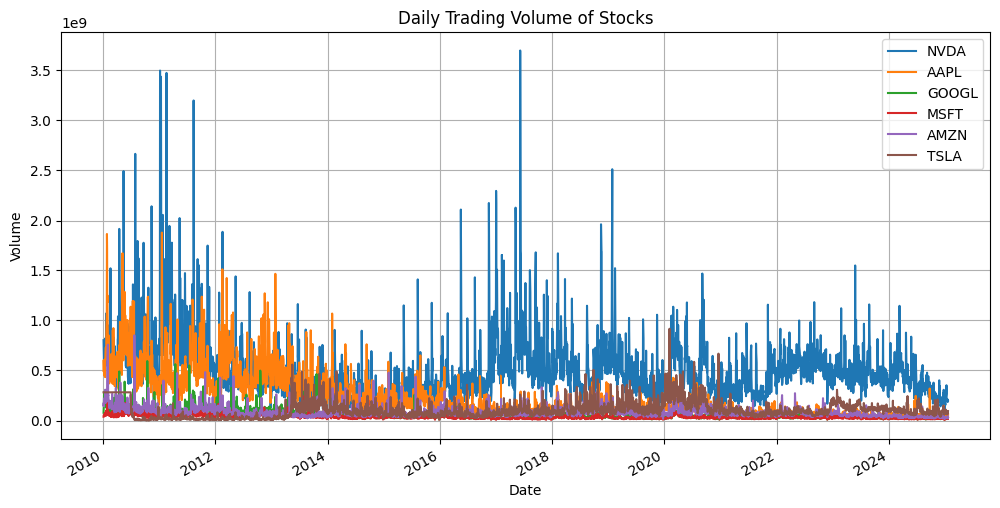

In [ ]:
# Group the data by date and sum the volume for each stock
daily_volume = data.groupby('Date')[[('Volume', 'NVDA'), ('Volume', 'AAPL'), ('Volume', 'GOOGL'), ('Volume', 'MSFT'), ('Volume', 'AMZN'), ('Volume', 'TSLA')]].sum()

# Print or further analyze the daily_volume DataFrame
print(daily_volume)

# Visualization (optional): Plot the daily volume for each stock
daily_volume.plot(figsize=(12, 6))
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Daily Trading Volume of Stocks')
plt.legend(tickers)
plt.grid(True)
plt.show()


**Key Observations:**

**Fluctuations:** The stock volume for all companies fluctuates over time, with periods of high trading activity followed by periods of lower activity.

**Trends:**
The NVDA stock volume shows the most consistent high volume trading across the years, suggesting a large and active company with significant trading volume.
The AAPl stock volume shows a similar trend, with spikes in volume throughout the years, particularly between 2010 and 2012.
The TSLA and AMZN lines exhibit lower trading volumes, but still with significant fluctuations over time.
The MSFT and GOOGL lines depict the lowest trading volumes among the six companies, with smaller and less frequent spikes in activity.

**Notable Spikes:** All companies experience periods of extremely high trading volume, potentially indicating specific events or market fluctuations that caused increased investor interest.

**Conclusions:**

The chart indicates that the trading volume of stocks can vary significantly over time, reflecting changes in market conditions, investor sentiment, and company-specific events.
The companies with the highest trading volumes likely have larger market capitalization and more active investor interest, making them more influential in the market.

The companies with lower trading volumes may be smaller or less well-known, with fewer investors participating in their stock transactions.
Analyzing the timing of these spikes in volume can provide insights into factors affecting the market, such as news releases, economic indicators, and investor sentiment.

### Analyse Daily price change in stock

Daily Stock Return Formula

Analyse Daily return of each stock and how they are correlated

In [ ]:
# Calculate percentage change for each ticker
for ticker in tickers:
    # Access data for the specific ticker using a tuple
    close_price = data[('Close', ticker)]
    open_price = data[('Open', ticker)]
    data[f'{ticker}_change'] = ((close_price - open_price) / close_price) * 100

# Display the resulting DataFrame
print(data.head(5))

Price      Adj_Close                                                    \
Ticker          AAPL    AMZN      GOOGL       MSFT      NVDA      TSLA   
Date                                                                     
2010-01-04  6.447412  6.6950  15.627782  23.300682  0.423923  1.592667   
2010-01-05  6.458559  6.7345  15.558963  23.308210  0.430113  1.592667   
2010-01-06  6.355826  6.6125  15.166740  23.165171  0.432864  1.592667   
2010-01-07  6.344079  6.5000  14.813666  22.924250  0.424381  1.592667   
2010-01-08  6.386255  6.6760  15.011149  23.082346  0.425298  1.592667   

Price          Close                                ... Returns  Year Month  \
Ticker          AAPL    AMZN      GOOGL       MSFT  ...    TSLA               
Date                                                ...                       
2010-01-04  7.643214  6.6950  15.684434  30.950001  ...     NaN  2010     1   
2010-01-05  7.656429  6.7345  15.615365  30.959999  ...     0.0  2010     1   
2010-01-06  

### Correlation

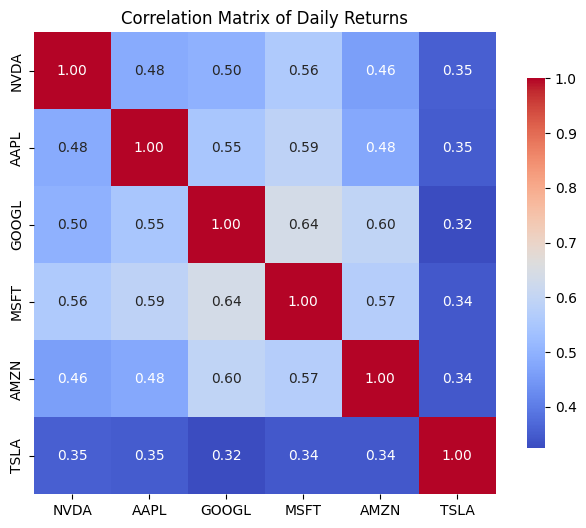

In [ ]:
# Calculate the daily returns and store in a variable called 'Returns'
Returns = pd.DataFrame()  # Create an empty DataFrame to store returns
for ticker in tickers:
    Returns[ticker] = data[('Adj_Close', ticker)].pct_change()

# Now you can use 'Returns' in the next cell
correlation_matrix = Returns.corr()

# Plotting the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Daily Returns')
plt.show()

The correlation matrix visualizes the relationships between the daily returns of six tech stocks: NVDA, AAPL, GOOGL, MSFT, AMZN, and TSLA. Here are the key observations:

**Strong Positive Correlation:**
NVDA, AAPL, GOOGL, MSFT, and AMZN demonstrate a strong positive correlation with each other, with correlation coefficients ranging from 0.46 to 0.64. This implies that their prices tend to move in the same direction.

**Moderately Positive Correlation:**
TSLA shows a moderately positive correlation with the other stocks, with coefficients ranging from 0.33 to 0.36. This indicates a weaker but still noticeable positive relationship.

**Interpretation:**

**High Correlation:**The high correlation among the five stocks (NVDA, AAPL, GOOGL, MSFT, AMZN) suggests that they are influenced by similar market factors. These companies might be susceptible to similar economic trends, investor sentiment, or industry-specific news.

**Moderately Correlated:** TSLA exhibits a weaker relationship with the other stocks, indicating that it might be driven by different factors. Its performance could be influenced by specific developments in the electric vehicle and renewable energy industries.


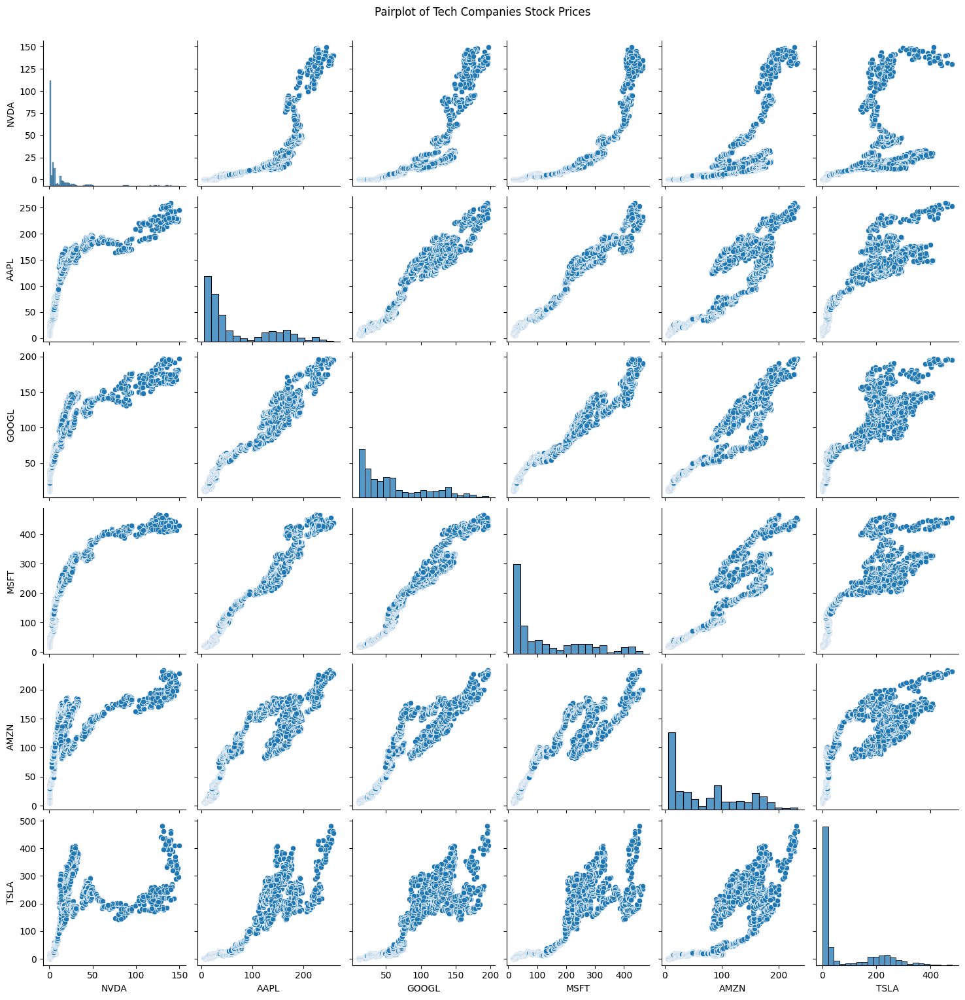

In [ ]:
# Access the desired columns using a MultiIndex
price_data = data[[('Adj_Close', t) for t in tickers]]

# Rename the columns for better readability in the pairplot
price_data.columns = tickers

# Create a pairplot to visualize the relationships between stock prices
sns.pairplot(price_data)
plt.suptitle('Pairplot of Tech Companies Stock Prices', y=1.02)
plt.show()

The plots show that the stock prices of all six companies have generally increased over time, indicating a positive trend in their performance.
However, the plots also reveal some interesting insights about the individual companies:

**NVIDIA** has seen a significant rise in its stock price, particularly in the last few years.
AAPL has shown a more steady and gradual increase in its stock price.

**GOOGL** exhibits a similar trend to AAPL, with a steady growth in its stock price.
MSFT shows a more volatile pattern, with periods of significant price increases and decreases.

**AMZN** also displays a fairly consistent growth in its stock price, with some fluctuations along the way.

**TSLA** has experienced a more volatile trend, with periods of sharp increases and drops in its stock price.

The second image provides the volume of stocks traded for all six companies, grouped by date. Analyzing the volume of stocks traded can provide valuable insights into market sentiment and investor activity. This analysis, however, is not present in the image.

***Overall, the plots highlight the diverse performance of different companies in the stock market. Some companies show a more consistent growth trajectory, while others display greater volatility. The analysis of stock price and trading volume can provide a better understanding of market dynamics and investor behavior.***

## 2. Visualizations

### 2.1. Visualizing volatility

 It is important to understand stock volatility since it is crucial for both traders and investors. A way to gauge this volatility is by inspecting the distribution of daily percentage changes in stock prices. By observing the spread and central tendency of these daily changes, we can gather insights into the stock's typical behavior and identify unusual patterns or outliers.

In [ ]:
# Calculate daily percentage change for each ticker
change_percent = data['Adj_Close'].pct_change() * 100  # Convert to percentage

# Create a dictionary to hold DataFrames for each ticker
dataframes = {ticker: change_percent[ticker] for ticker in tickers}

# Define colors for each ticker
colors = {
    "NVDA": "green",
    "AAPL": "lightblue",
    "GOOGL": "purple",
    "MSFT": "blue",
    "AMZN": "orange",
    "TSLA": "darkred"
}

# Line plot for Daily Percentage Change
fig = go.Figure()

# Add traces for each stock
for stock in tickers:
    fig.add_trace(go.Scatter(
        x=change_percent.index,
        y=dataframes[stock],
        mode='lines',
        name=stock,
        line=dict(color=colors[stock])
    ))

# Update layout of the figure
fig.update_layout(
    title='Daily Percentage Change for NVDA, AAPL, GOOGL, MSFT, AMZN, and TSLA',
    xaxis_title='Date',
    yaxis_title='Percentage Change',
    template='plotly_white'
)

# Show the figure
fig.show()

**Findings:**

**TSLA** shows the most volatility, with the highest peaks and lowest dips.

**NVDA** also demonstrates significant fluctuation but with less extreme peaks and dips compared to TSLA.

**AAPL, GOOGL, MSFT, and AMZN** exhibit less volatility, staying mostly within a smaller range of percentage change.

**Overall**, all six stocks demonstrate fluctuations and trends that likely correspond to market events, news, and investor sentiment.

**Further Analysis:**

To gain a more comprehensive understanding, further analysis is necessary:

**Time Period:** The specific time frame of the data is not clear, hindering accurate interpretation of trends.

**Statistical Measures:** Calculating mean, standard deviation, and correlation between the stocks can provide deeper insights into their performance and relationship.

**External Factors:** Examining economic indicators, industry news, and events occurring during the period can provide context for the observed fluctuations.

In [ ]:
# Volatility Analysis
volatility = Returns.std() * np.sqrt(252)  # Annualized volatility
print("\nAnnualized Volatility:\n", volatility)

# Value at Risk (VaR)
confidence_level = 0.95
VaR = Returns.quantile(1 - confidence_level)
print("\nValue at Risk (VaR) at 95% confidence level:\n", VaR)


Annualized Volatility:
 NVDA     0.454582
AAPL     0.278686
GOOGL    0.273220
MSFT     0.255544
AMZN     0.327028
TSLA     0.564880
dtype: float64

Value at Risk (VaR) at 95% confidence level:
 NVDA    -0.041928
AAPL    -0.026557
GOOGL   -0.025186
MSFT    -0.024353
AMZN    -0.029949
TSLA    -0.050304
Name: 0.050000000000000044, dtype: float64


**Observations:**

**High Volatility:** All six stocks exhibit significant volatility in their daily price fluctuations, reflected by the frequent and substantial price swings.

**TSLA and NVDA:** These two stocks stand out with the highest volatility compared to the others. TSLA, in particular, exhibits the most extreme price changes, with spikes reaching above 30% and dips exceeding -20%.

**Correlation:** While individual stocks display high volatility, there seems to be a degree of correlation between their price movements. This suggests that external factors, such as market sentiment or economic events, can influence multiple stocks simultaneously.

**Red Line (TSLA):** The red line representing TSLA's price fluctuations dominates the graph, indicating a greater overall price change compared to other stocks.

**Clustering:** While not clearly defined in the given image, we can observe periods where stock prices move together, creating clusters of lines close to each other. This reinforces the notion that external factors can influence market movements collectively.

While all companies display significant price fluctuations, TSLA and NVDA stand out for their extreme volatility.

In [ ]:
# Create a combined DataFrame for boxplot
combined_df = pd.concat(
    [change_percent[ticker].rename('change_percent').reset_index().assign(stock=ticker) for ticker in tickers],
    ignore_index=True
)

# Define colors for each ticker
colors = {
    "NVDA": "green",
    "AAPL": "lightblue",
    "GOOGL": "purple",
    "MSFT": "blue",
    "AMZN": "orange",
    "TSLA": "darkred"
}

# Boxplot for Daily Percentage Change
fig3 = go.Figure()

# Add box traces for each stock
for stock in tickers:
    fig3.add_trace(go.Box(
        y=combined_df[combined_df['stock'] == stock]['change_percent'],
        name=stock,
        line=dict(color=colors[stock])
    ))

# Update layout of the figure
fig3.update_layout(
    title='Boxplot of Daily Percentage Change for NVDA, AAPL, GOOGL, MSFT, AMZN, and TSLA',
    yaxis_title='Percentage Change',
    template='plotly_white'
)

# Show the figure
fig3.show()

**Key Findings:**

**NVDA:**
Exhibits the highest daily percentage changes, with a few outliers reaching above 30%.
The median change is slightly above 0%.
The distribution of changes is highly skewed towards the negative side.

**AAPL:**
Shows less extreme fluctuations in daily percentage change compared to NVDA.
The median change is around 0%.
The distribution is slightly skewed towards the negative side.

**GOOGL:**
The daily percentage change distribution is more symmetrical around the median, which is close to 0%.
The range of change is moderate compared to NVDA and AAPL.

**MSFT:**
Similar to GOOGL, the distribution of daily percentage changes is fairly symmetrical.
The median change is slightly negative, around -2%.
The range of change is moderate, with fewer extreme outliers.

**AMZN:**
Shows a higher spread in daily percentage change compared to GOOGL and MSFT.
The median change is slightly positive, around 2%.
The distribution appears to be slightly skewed towards the positive side.

**TSLA:**
Exhibits the most volatile daily percentage change among the six companies.
The median change is slightly negative, around -3%.
The distribution is highly skewed towards the negative side, with many outliers showing significant negative changes.
Overall Observations:

**Volatility:** TSLA displays the highest volatility, followed by NVDA, while AAPL, GOOGL, and MSFT show relatively more stable daily percentage changes.
Median Change: Most of the companies have a median change close to 0%, suggesting no significant overall positive or negative trend in their daily percentage change.
Skewness: NVDA and TSLA exhibit strong negative skewness, indicating a higher frequency of negative daily percentage changes.

**Conclusion:**

The boxplot reveals significant differences in the daily percentage change behavior of these six companies. While some companies exhibit a relatively stable performance, others like TSLA and NVDA show a high degree of volatility and are more prone to extreme price movements. This analysis highlights the varying risk profiles of these stocks, which can be crucial for investors when making decisions based on volatility and potential returns. Further investigation into the underlying factors driving these changes, such as market conditions and company-specific news, would provide a more comprehensive understanding of their performance dynamics.



In [ ]:
# Extract the 'Close' prices
close_prices = data['Adj_Close']

# Create a line plot for Closing Prices
fig = go.Figure()

# Add traces for each stock's closing price
for stock in tickers:
    fig.add_trace(go.Scatter(
        x=close_prices.index,
        y=close_prices[stock],
        mode='lines',
        name=stock
    ))

# Update layout of the figure
fig.update_layout(
    title='Evolution of Closing Prices Over Time',
    xaxis_title='Date',
    yaxis_title='Closing Price',
    template='plotly_white'
)

# Show the figure
fig.show()

**Overall Trend:**

All six companies display a positive upward trend in closing prices over the period represented by the graph. This indicates that these companies have been generally successful and have experienced growth in their stock value.
Individual Performances:

**TSLA (Tesla)** stands out with the most significant growth, exhibiting a much steeper incline than the other companies. This suggests a period of exceptional growth and market performance for Tesla.
**NVDA (Nvidia)** also demonstrates substantial growth, albeit slightly less pronounced than Tesla.
**AMZN (Amazon), GOOGL (Google), and MSFT (Microsoft)** have shown consistent and moderately strong growth, suggesting steady performance and increasing market value.
AAPL (Apple) displays the least significant growth among the six, indicating potentially slower growth compared to its peers.

**Volatility:**
The graph shows varying levels of volatility for the different companies.
TSLA and NVDA appear to be more volatile than others, with larger price fluctuations, indicating a higher degree of risk.
AAPL, GOOGL, and MSFT exhibit a relatively smoother trajectory, suggesting lower volatility and potentially less risk.

**Conclusion:**
This graph provides a snapshot of the relative performance of these companies over a specific period. It reveals that all six companies have experienced growth, albeit at different rates and levels of volatility. Investors can use this information to make informed decisions about investment strategies.

In [ ]:
# Create a line plot for Closing Prices
fig = go.Figure()

# Add traces for each stock's closing price
for stock in tickers:
    fig.add_trace(go.Scatter(
        x=close_prices.index,
        y=close_prices[stock],
        mode='lines',
        name=stock
    ))

# Update layout of the figure
fig.update_layout(
    title='Evolution of Closing Prices Over Time (Log Scale)',
    xaxis_title='Date',
    yaxis_title='Closing Price (Log Scale)',
    yaxis_type='log',  # Set Y-axis to logarithmic scale
    template='plotly_white'
)

# Show the figure
fig.show()

Using a logarithmic scale on the Y-axis is beneficial when examining stock data that has seen exponential growth. This scale emphasizes the percentage change, allowing clearer visualization of price fluctuations across varying price levels.

**Key Findings:**

**Growth Trend:** All six companies exhibit an overall upward trend in their closing prices over the observed period. This suggests that the value of these companies has increased over time.

**NVDA Outperformance:** NVDA has shown the most significant growth, with its closing price increasing the most rapidly.

**Similar Growth Patterns:** AAPL, GOOGL, and MSFT follow a similar growth pattern, with their closing prices staying relatively close to each other.

**Relative Stability:** AMZN and TSLA have experienced a more stable growth trajectory, with their closing prices fluctuating less drastically than the other four companies.

**Overall:**
The graph provides a visual representation of the evolution of closing prices for six companies. It highlights NVDA's strong performance, the similar growth trends of AAPL, GOOGL, and MSFT, and the relative stability of AMZN and TSLA. Further analysis would require additional information, such as the specific time period and relevant market conditions, to fully interpret the findings.

## Candlestick chart for different tickers

In [ ]:
symbol = "AAPL"
ticker = yf.Ticker(symbol)
data = ticker.history(period="1mo")  # Fetch data for the last month

In [ ]:
fig = go.Figure(data=[go.Candlestick(
    x=data.index,
    open=data['Open'],
    high=data['High'],
    low=data['Low'],
    close=data['Close']
)])

In [ ]:
fig.update_layout(
    title=f"{symbol} Candlestick Chart (1 Month)",
    yaxis_title="Price",
    xaxis_rangeslider_visible=False  # Hide the range slider
)
fig.show()

The chart displays the price movement of Apple (AAPL) stock over a period of one month, from late December 2024 to mid-January 2025.

**Observations:**

**Overall trend:** The stock price has been experiencing a downward trend, with a significant drop in the last week of the observed period.

**Declining Volume:** The size of the candlesticks (representing trading volume) is generally decreasing, indicating that there is less buying and selling activity in the market.

**Price Action:**
**December 29, 2024:** A large red candlestick suggests a significant drop in price, with buyers unable to sustain the price.
Early January: The stock experienced a period of volatility, with both bullish and bearish pressure, but ultimately trending downwards.

**Jan 12, 2025:** A bearish candlestick signifies continued downward pressure, indicating a stronger selling momentum.

**Jan 19, 2025:** The stock closed at a much lower price than the previous trading day, confirming a strong bearish trend.

**Key Findings:**
Bearish Trend: The chart suggests a strong bearish trend in the stock price.
Decreasing Volume: The decreasing volume suggests that investor interest and activity may be waning.
Possible Future Direction: The price action in the chart could indicate that the downward trend might continue in the coming days or weeks.

In [ ]:
symbol = "TSLA"
ticker = yf.Ticker(symbol)
data = ticker.history(period="3mo")  # Fetch data for the last 3 months

In [ ]:
fig = go.Figure(data=[go.Candlestick(
    x=data.index,
    open=data['Open'],
    high=data['High'],
    low=data['Low'],
    close=data['Close']
)])

fig.update_layout(
    title=f"{symbol} Candlestick Chart (3 Month)",
    yaxis_title="Price",
    xaxis_rangeslider_visible=False  # Hide the range slider
)
fig.show()

The chart displays the price movement of Apple (AAPL) stock over a period of one month, from late December 2024 to mid-January 2025.

**Observations:**

**Overall trend:** The stock price has been experiencing a downward trend, with a significant drop in the last week of the observed period.

**Declining Volume:** The size of the candlesticks (representing trading volume) is generally decreasing, indicating that there is less buying and selling activity in the market.

**Price Action:**

**December 29, 2024:** A large red candlestick suggests a significant drop in price, with buyers unable to sustain the price.

**Early January:** The stock experienced a period of volatility, with both bullish and bearish pressure, but ultimately trending downwards.

**Jan 12, 2025:** A bearish candlestick signifies continued downward pressure, indicating a stronger selling momentum.

**Jan 19, 2025:** The stock closed at a much lower price than the previous trading day, confirming a strong bearish trend.

**Key Findings:**

**Bearish Trend:** The chart suggests a strong bearish trend in the stock price.
Decreasing Volume: The decreasing volume suggests that investor interest and activity may be waning.

**Possible Future Direction:** The price action in the chart could indicate that the downward trend might continue in the coming days or weeks.

In [ ]:
import plotly.graph_objects as go

# Download historical data for TSLA
symbol = 'TSLA'
ticker = yf.Ticker(symbol)
data = ticker.history(period='3mo')  # Fetch data for the last 3 months

# Calculate moving averages
data['MA10'] = data['Close'].rolling(window=10).mean()
data['MA20'] = data['Close'].rolling(window=20).mean()
data['MA50'] = data['Close'].rolling(window=50).mean()

# Create subplots
fig = go.Figure()

# Add candlestick chart
fig.add_trace(go.Candlestick(
    x=data.index,
    open=data['Open'],
    high=data['High'],
    low=data['Low'],
    close=data['Close'],
    name='Candlestick'
))

# Add moving averages
fig.add_trace(go.Scatter(
    x=data.index,
    y=data['MA10'],
    mode='lines',
    name='MA 10',
    line=dict(color='blue', width=1)
))

fig.add_trace(go.Scatter(
    x=data.index,
    y=data['MA20'],
    mode='lines',
    name='MA 20',
    line=dict(color='orange', width=1)
))

fig.add_trace(go.Scatter(
    x=data.index,
    y=data['MA50'],
    mode='lines',
    name='MA 50',
    line=dict(color='green', width=1)
))

# Add volume bar chart
fig.add_trace(go.Bar(
    x=data.index,
    y=data['Volume'],
    name='Volume',
    marker_color='rgba(0, 0, 255, 0.3)',
    yaxis='y2'  # Use secondary y-axis for volume
))

# Update layout of the figure
fig.update_layout(
    title=f"{symbol} Candlestick Chart (3 Month)",
    yaxis_title="Price",
    yaxis2=dict(title='Volume', overlaying='y', side='right'),
    xaxis_rangeslider_visible=False  # Hide the range slider
)

# Show the figure
fig.show()

This chart visualizes the price movement of Tesla (TSLA) stock over a 3-month period, from November 2024 to January 2025. Here's a breakdown:

**Candlestick Chart:**
The green and red candles represent the price action of TSLA stock.
Green candles indicate a closing price higher than the opening price, while red candles indicate a closing price lower than the opening price.

The body of the candle represents the price difference between the open and close.
The wicks above and below the body represent the highest and lowest prices reached during the trading period.

**Moving Averages (MA):**
The chart includes three moving averages:

**MA 10:** A blue line representing the average price over the past 10 trading days.

**MA 20:** A yellow line representing the average price over the past 20 trading days.

**MA 50:** A purple line representing the average price over the past 50 trading days.
Moving averages are used to smooth out price fluctuations and identify potential trends.

**Volume:**
The blue bars below the candlestick chart represent trading volume.

Higher bars indicate higher trading activity.
Volume is a good indicator of market interest and can be used to confirm trends or identify potential reversals.

**Key Observations:**
**Bullish Trend:** The overall trend of TSLA during this period appears to be bullish. This is evidenced by the upward slope of the moving averages, especially the MA 50.

**Volatility:** The chart exhibits significant volatility, with large price swings both upwards and downwards.

**Potential Reversal:** The recent drop in price coupled with the volume spike suggests a potential reversal of the bullish trend.

## Technical indicators

In [ ]:
def get_technical_indicators(dataset):
    # Create 7 and 21 days Moving Average
    # Accessing data using ticker symbols directly (e.g., dataset['NVDA'])
    dataset['ma7'] = dataset.mean(axis=1).rolling(window=7).mean()
    dataset['ma21'] = dataset.mean(axis=1).rolling(window=21).mean()

    # Create MACD
    dataset['26ema'] = dataset.mean(axis=1).ewm(span=26).mean()
    dataset['12ema'] = dataset.mean(axis=1).ewm(span=12).mean()
    dataset['MACD'] = (dataset['12ema']-dataset['26ema'])

    # Create Bollinger Bands
    dataset['20sd'] = dataset.mean(axis=1).rolling(window=20).std()
    dataset['upper_band'] = dataset['ma21'] + (dataset['20sd']*2)
    dataset['lower_band'] = dataset['ma21'] - (dataset['20sd']*2)

    # Create Exponential moving average
    dataset['ema'] = dataset.mean(axis=1).ewm(com=0.5).mean()

    # Create Momentum
    dataset['momentum'] = dataset.mean(axis=1)-1

    return dataset

In [ ]:
dataset_df = get_technical_indicators(Returns[tickers])  # Use tickers directly as column names
dataset_df

,NVDA,AAPL,GOOGL,MSFT,AMZN,TSLA,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
Date,,,,,,,,,,,,,,,,
2010-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-05,0.014603,0.001729,-0.004404,0.000323,0.005900,0.000000,NaN,NaN,0.003025,0.003025,0.000000,NaN,NaN,NaN,0.002689,-0.997311
2010-01-06,0.006396,-0.015906,-0.025209,-0.006137,-0.018116,0.000000,NaN,NaN,-0.003649,-0.003459,0.000190,NaN,NaN,NaN,-0.004819,-1.007071
2010-01-07,-0.019597,-0.001848,-0.023279,-0.010400,-0.017013,0.000000,NaN,NaN,-0.006658,-0.006502,0.000155,NaN,NaN,NaN,-0.008032,-1.009318
2010-01-08,0.002161,0.006648,0.013331,0.006896,0.027077,0.000000,NaN,NaN,-0.002182,-0.002018,0.000164,NaN,NaN,NaN,0.001295,-0.994663
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-13,-0.019719,-0.010344,-0.005363,-0.004201,-0.002192,0.021711,-0.001611,-0.000396,-0.000207,-0.002112,-0.001905,0.009783,0.019170,-0.019962,-0.002339,-1.001313
2025-01-14,-0.011034,-0.004778,-0.007068,-0.003643,-0.003204,-0.017232,-0.001311,-0.002004,-0.000657,-0.002658,-0.002001,0.009836,0.017667,-0.021675,-0.003149,-1.003527
2025-01-15,0.034001,0.019676,0.031056,0.025597,0.025671,0.080382,-0.000125,-0.000288,0.001391,0.001467,0.000075,0.010843,0.021398,-0.021974,0.009863,-0.984065


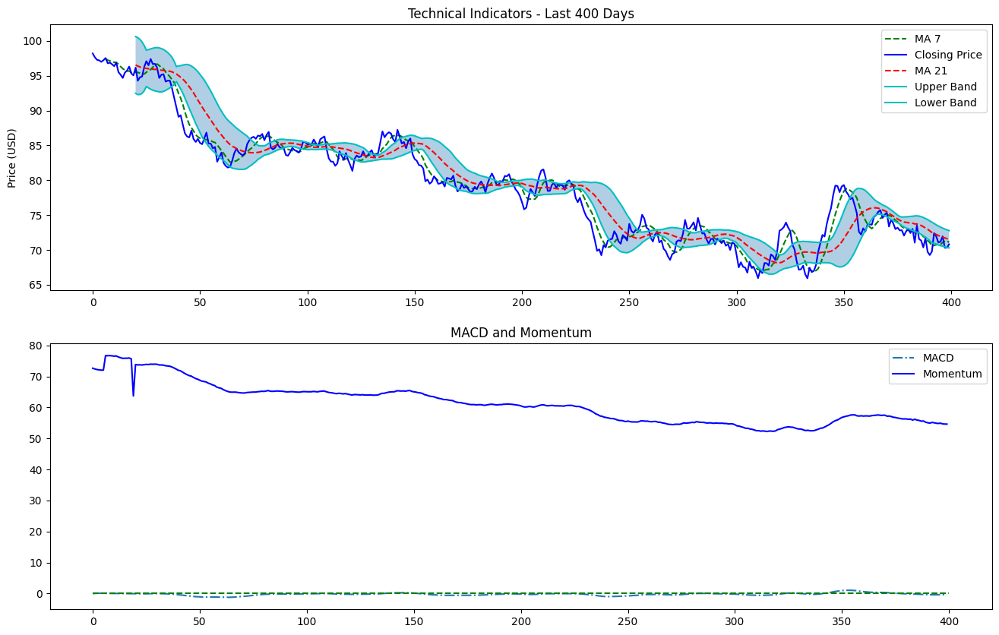

In [ ]:
# visualize the last 400 days of these indicators
import numpy as np

# Function to generate sample data (replace with your actual data if needed)
def generate_sample_data():
    # Replace with your actual logic to generate data. This is just an example.
    num_days = 400  # Number of days to generate data for
    price = 100 + np.cumsum(np.random.randn(num_days))  # Random walk for price
    data = pd.DataFrame({'price': price})
    return data

# Function to plot technical indicators
def plot_technical_indicators(dataset_df, last_days):
    plt.figure(figsize=(16, 10), dpi=100)

    # Get the shape of the dataset
    shape_0 = dataset_df.shape[0]

    # Select the last 'last_days' entries
    dataset = dataset_df.iloc[-last_days:, :]

    # Create x-axis values for the last 'last_days'
    x_ = range(shape_0 - last_days, shape_0)  # Adjust x-axis for the last days

    # Plot first subplot
    plt.subplot(2, 1, 1)
    plt.plot(dataset_df['ma7'], label='MA 7', color='g', linestyle='--')
    plt.plot(dataset_df['price'], label='Closing Price', color='b')  # Assuming 'price' is in the dataset
    plt.plot(dataset_df['ma21'], label='MA 21', color='r', linestyle='--')
    plt.plot(dataset_df['upper_band'], label='Upper Band', color='c')
    plt.plot(dataset_df['lower_band'], label='Lower Band', color='c')
    plt.fill_between(x_, dataset['lower_band'], dataset['upper_band'], alpha=0.35)
    plt.title('Technical Indicators - Last {} Days'.format(last_days))
    plt.ylabel('Price (USD)')
    plt.legend()

    # Plot second subplot
    plt.subplot(2, 1, 2)
    plt.title('MACD and Momentum')
    plt.plot(dataset['MACD'], label='MACD', linestyle='-.')
    plt.hlines(0, 0, last_days, colors='g', linestyles='--')
    #plt.plot(dataset['log_momentum'], label='Momentum', color='b', linestyle='-') # Commented out as "log_momentum" is not calculated
    plt.plot(dataset['momentum'], label='Momentum', color='b', linestyle='-') # Assuming you meant to use the existing 'momentum' column

    plt.legend()
    plt.show()

# Generate sample data
data_df = generate_sample_data()

# Calculate technical indicators
dataset_df = get_technical_indicators(data_df) # Changed to use data_df which contains "price" as column

# Plot the last 400 days of indicators
plot_technical_indicators(dataset_df, last_days=400)

The output consists of two subplots that visualize the technical indicators over the last 400 days.The chart includes the following indicators:

*   7-day Moving Average (MA 7)
*   21-day Moving Average (MA 21)
*   Upper Band
*   Lower Band

**Top Subplot:**

Displays the closing price(green) of the stock along with the 7-day(blue) and 21-day(red) moving averages.                      
The upper and lower Bollinger Bands are also plotted, providing a range within which the price typically moves.                
The area between the upper and lower bands is shaded, indicating the volatility of the stock price.                     
The price movement shows a general upward trend, with recent prices approaching the lower band, suggesting potential oversold conditions.
The price is generally decreasing over the last 400 days.                          
The price has been trading above the MA 21, indicating an upward trend.                   
The price has been trading below the Bollinger Bands, indicating oversold conditions.

**Bottom Subplot:**

Illustrates the MACD(green) and Momentum indicators(blue).              
The MACD line fluctuates above and below the zero line, indicating periods of bullish and bearish momentum.                
The MACD is below the Momentum, indicating a weakening trend.                     
The Momentum indicator shows the rate of price change, with values currently below zero, indicating bearish momentum.                  
The relationship between the MACD and the price can highlight potential trend reversals, with divergence suggesting shifts in market sentiment.


## Stationarity

In [ ]:
data.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits',
       'MA10', 'MA20', 'MA50'],
      dtype='object')

In [ ]:
data['Dividends'].astype('str').value_counts()

,count
Dividends,
0.0,61


In [ ]:
data['Stock Splits'].astype('str').value_counts()

,count
Stock Splits,
0.0,61


In [ ]:
# Drop Dividends and Stock Splits from data frame
data = data.drop(columns=['Dividends', 'Stock Splits'])

In [ ]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

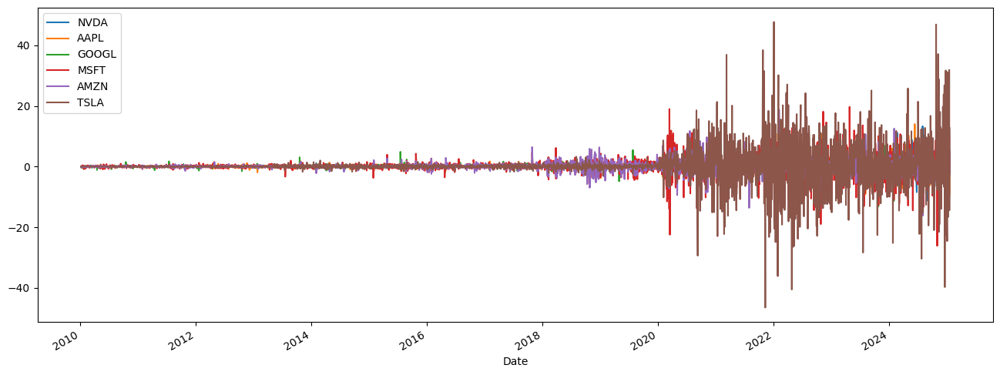

In [ ]:
diff_price = price_data - price_data.shift(1) # Changed 'price' to 'price_data'
diff_price.plot(figsize = (16,6))
plt.show()

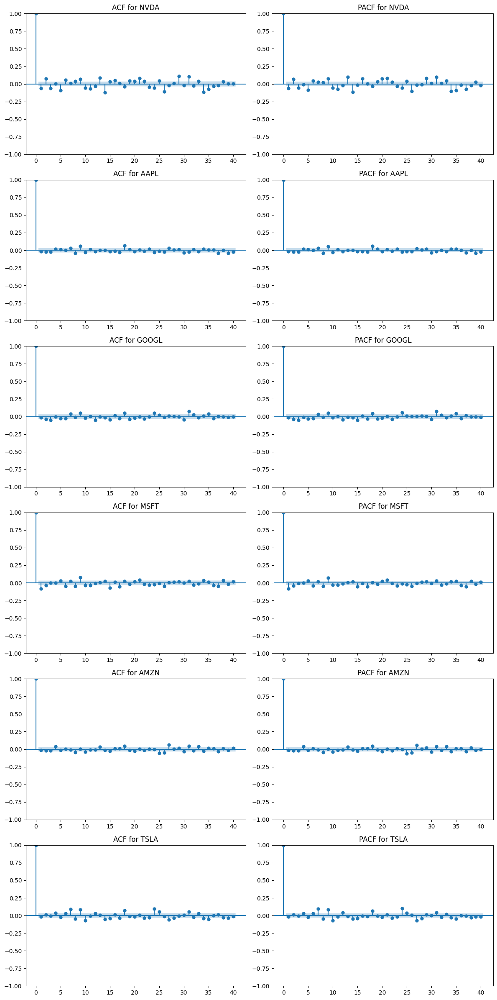

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Assume tickers and diff_price are defined
num_stocks = len(tickers)

# Create subplots for ACF and PACF side by side
fig, axes = plt.subplots(nrows=num_stocks, ncols=2, figsize=(12, 4 * num_stocks))

for i, ticker in enumerate(tickers):
    # Ensure no NaN values in differenced price data
    diff_price = diff_price.dropna()

    # Plot ACF
    plot_acf(diff_price[ticker], ax=axes[i, 0], lags=40)
    axes[i, 0].set_title(f'ACF for {ticker}')

    # Plot PACF
    plot_pacf(diff_price[ticker], ax=axes[i, 1], lags=40)
    axes[i, 1].set_title(f'PACF for {ticker}')

# Adjust layout
plt.tight_layout()
plt.show()


**NVDA:** ACF shows exponential decay with a few spikes, and PACF cuts off sharply after lag 1. This suggests an AR(1) model.

**AAPL:** Similar to NVDA, suggesting an AR(1) model.

**AMZN:** ACF and PACF cut off sharply at lag 0. This could indicate a white noise process with no AR or MA components.

**TSLA:** Both ACF and PACF show significant spikes at lag 1, suggesting an AR(1) model.

**GOOGL:** Similar to NVDA, suggesting an AR(1) model.

**MSFT:** Similar to NVDA, suggesting an AR(1) model.

Potential models include the ARIMA model, Random walk, Seasonal ARIMA (SARIMA). Then compare their performance using metrics like AIC and BIC, and assess the residuals of the chosen model to ensure it is a good fit.

### Augmented Dickey-Fuller test

Null: Non-stationary

Alternative: Stationary

TS < critical value....> Reject null

In [ ]:
# load library for Augmented Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller

### White noise Process

The ADF test is used to check for stationarity in a time series, and a high p-value (> 0.05) indicates that the series is likely non-stationary, meaning it has a trend or autocorrelation structure rather than resembling white noise.

In [ ]:
from statsmodels.tsa.stattools import adfuller, acf, q_stat

In [ ]:
# Function to perform ADF test
def adf_test(series):
    # Drop rows with missing or infinite values
    series = series.dropna()
    series = series[np.isfinite(series)]

    result = adfuller(series)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'   {key}: {value}')
    print('---')

# Check for white noise in each stock's Adjusted Close prices
for ticker in tickers:
    print(f'Checking for white noise in {ticker}:')
    # Access data using the ticker directly as column name
    adf_test(diff_price[ticker]) # Changed from price_data[('Adj_Close', ticker)]

Checking for white noise in NVDA:
ADF Statistic: -9.22653863010561
p-value: 1.7231010954847214e-15
Critical Values:
   1%: -3.4320936126640174
   5%: -2.8623104319229618
   10%: -2.5671801115022364
---
Checking for white noise in AAPL:
ADF Statistic: -14.049667720461718
p-value: 3.1941465375205344e-26
Critical Values:
   1%: -3.4320875897105005
   5%: -2.8623077714001406
   10%: -2.5671786951365445
---
Checking for white noise in GOOGL:
ADF Statistic: -10.921307401740322
p-value: 1.0363599491594936e-19
Critical Values:
   1%: -3.4320936126640174
   5%: -2.8623104319229618
   10%: -2.5671801115022364
---
Checking for white noise in MSFT:
ADF Statistic: -13.958130533910797
p-value: 4.571707869314713e-26
Critical Values:
   1%: -3.432091291208667
   5%: -2.862309406465753
   10%: -2.567179565585966
---
Checking for white noise in AMZN:
ADF Statistic: -11.483897860332103
p-value: 4.918692369119796e-21
Critical Values:
   1%: -3.4320936126640174
   5%: -2.8623104319229618
   10%: -2.5671801

All the series are Non - stationary because test statistics are greater than the critical values @ 5%, therefore we do not Reject the null

Do not reject the null of non stationarity since the test statistic is Less negative than the 5% critical value

**Key Observations:**

**All p-values are very high (~0.99 or 1.0)**

This suggests that we fail to reject the null hypothesis that the time series has a unit root (non-stationary).

Therefore, the series were white noise (purely random), we would expect stationarity, meaning low p-values (typically < 0.05).

**ADF Statistics are not strongly negative**

In most cases, the ADF statistic is positive or close to zero (e.g., MSFT: 1.96, NVDA: 3.48, AAPL: 1.05, GOOGL: 1.74).
A strongly negative ADF statistic (lower than the critical values at 1%, 5%, or 10%) would indicate stationarity, which is not the case here.
Critical Values are much lower than ADF Statistics. The ADF statistic should be lower than the critical values (at 1%, 5%, or 10%) for us to reject the null hypothesis and conclude stationarity. In this case, the ADF statistics are higher than the critical values, further confirming non-stationarity.

**Conclusion:**

The stocks do not exhibit white noise properties because white noise should be stationary with no autocorrelation.         
The high p-values and positive ADF statistics indicate strong trends or dependencies in the data, which is typical for financial time series.                                      
To make the data more stationary and closer to white noise, transformations like differencing (e.g., first-order differencing) or detrending could be applied before further analysis.

### Time Series Decomposition

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

for ticker, prices in diff_price.items():
    # Perform seasonal decomposition
    decomposition = seasonal_decompose(prices, model='additive', period=12)  # Assuming monthly data

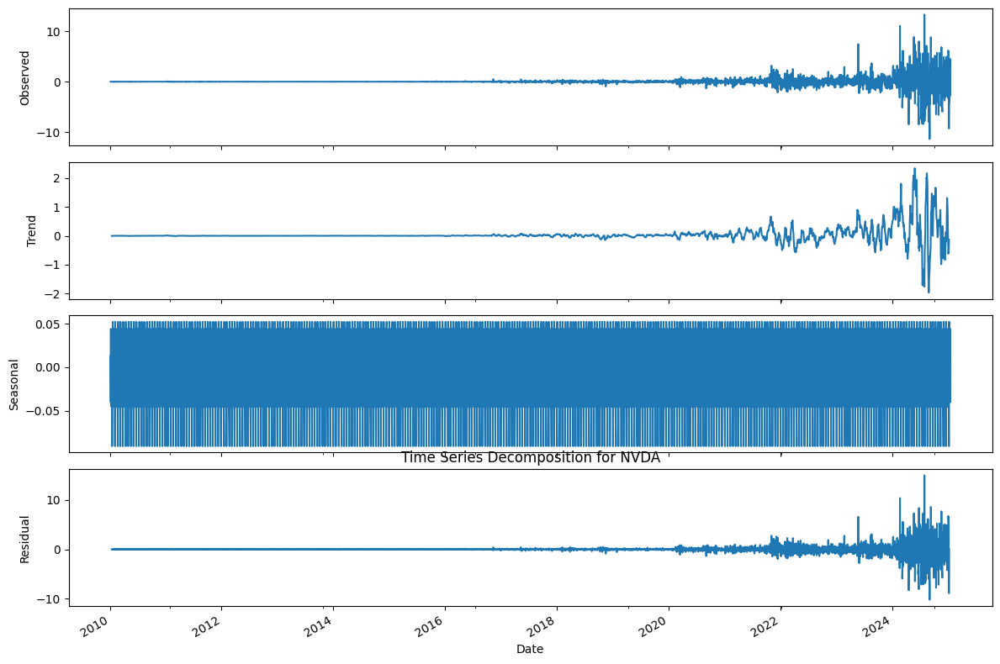

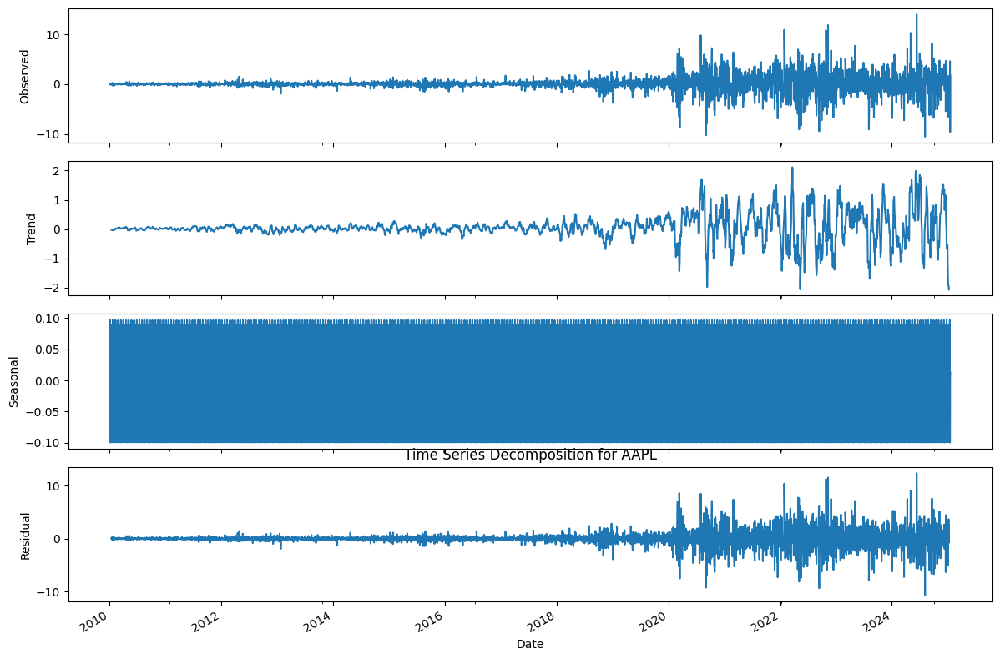

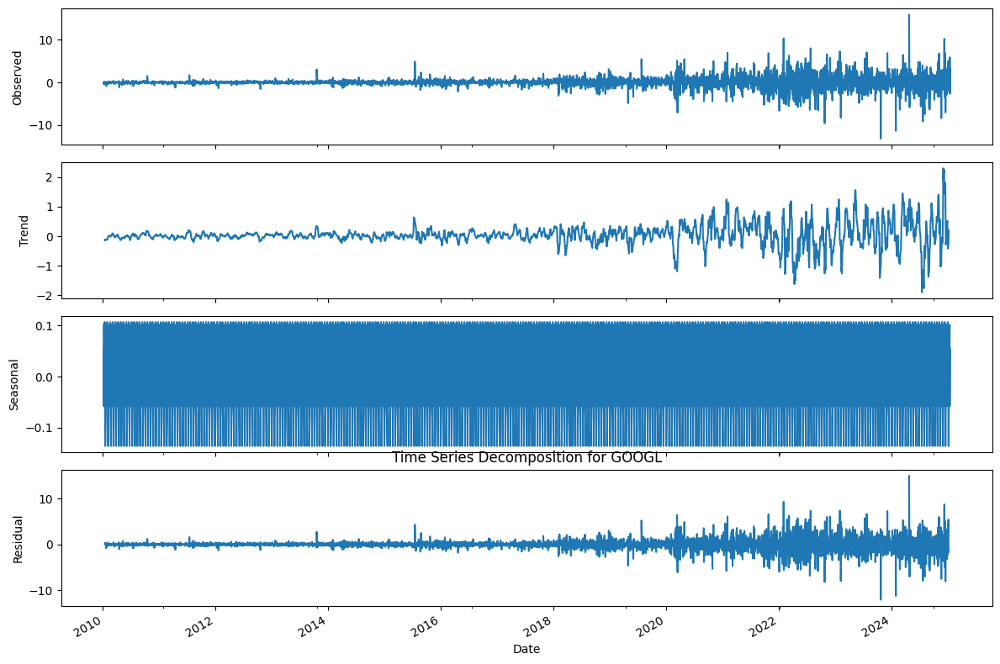

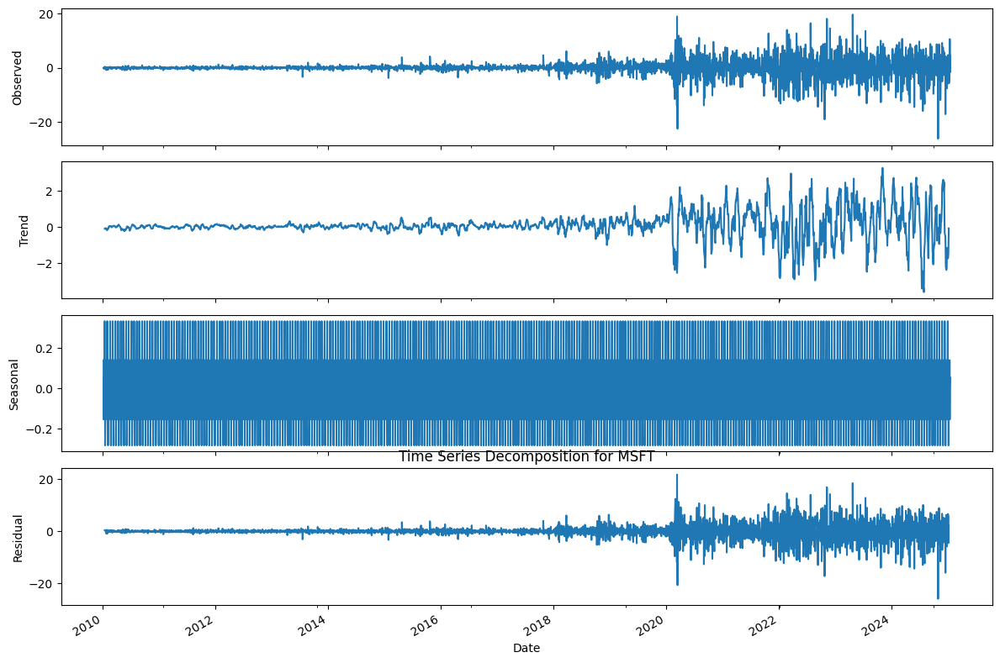

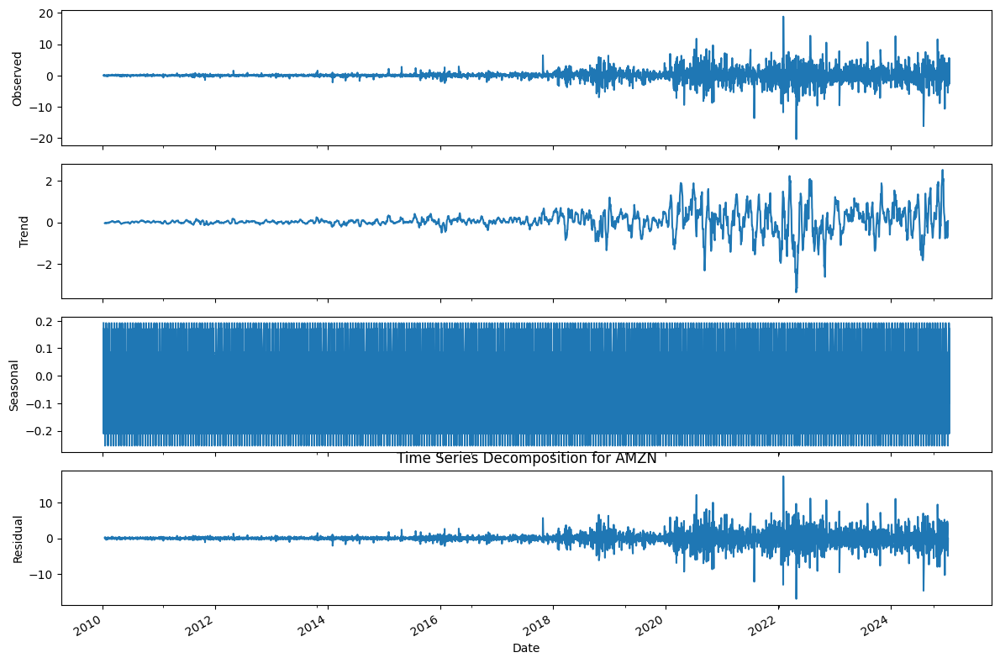

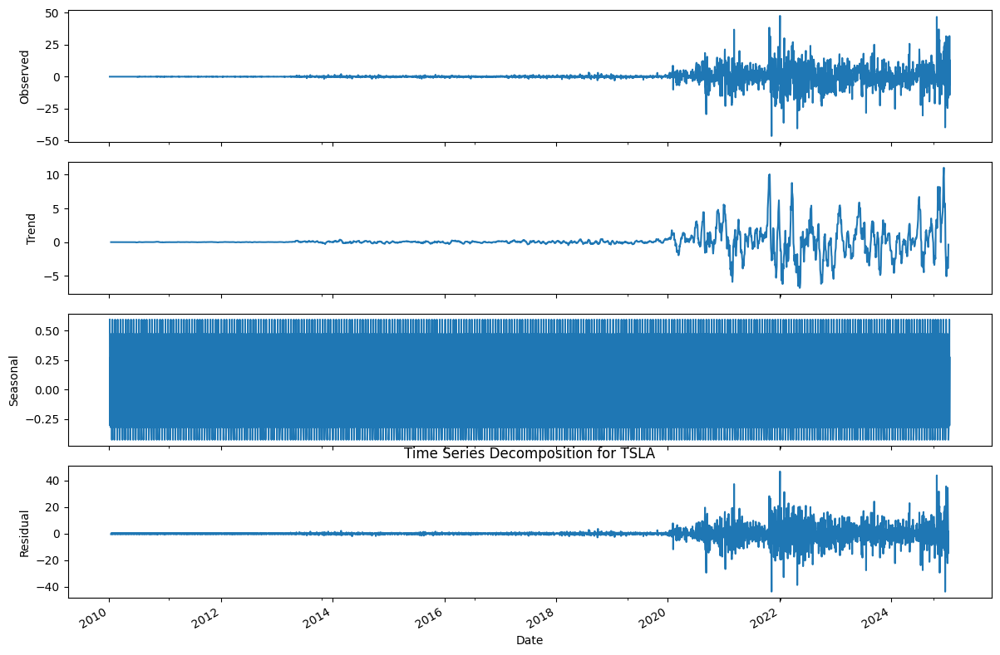

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Assuming diff_price is your time series data
for ticker, prices in diff_price.items():
    # Perform seasonal decomposition
    decomposition = seasonal_decompose(prices, model='additive', period=12)  # Assuming monthly data

    # Plot the decomposition components
    fig, axes = plt.subplots(4, 1, sharex=True, figsize=(12, 8))

    decomposition.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')

    decomposition.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')

    decomposition.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')

    decomposition.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residual')

    plt.tight_layout()
    plt.title(f"Time Series Decomposition for {ticker}")
    plt.show()

In [ ]:
# **Create an Annual trend analysis
import plotly.graph_objs as go
from statsmodels.tsa.seasonal import seasonal_decompose

# Assuming diff_price is your time series data
for ticker, prices in diff_price.items():
    # Perform seasonal decomposition
    decomposition = seasonal_decompose(prices, model='additive', period=12)  # Assuming monthly data

    # Create a figure with a single trace using the decomposition object
    fig = go.Figure(data=[go.Scatter(x=diff_price.index, y=decomposition.trend, mode='lines', name='Trend')])

    # Update layout for better visualization
    fig.update_layout(height=600, width=1000, title_text='Trend of stock price difference', showlegend=False)
    fig.update_yaxes(title_text="Value")

    # Show the interactive plot
    fig.show()

## ARIMA

The Autoregressive Integrated Moving Average (ARIMA) model is a widely used time series forecasting technique that combines three key components: Autoregression (AR), Differencing (I - Integration), and Moving Average (MA). The AR component captures relationships between past and present values, the I component makes the time series stationary by removing trends, and the MA component models the relationship between past forecast errors and current values.

The ARIMA model is represented as ARIMA(p, d, q), where:

p is the number of autoregressive lags (determined using PACF).
d is the number of times the data is differenced to achieve stationarity.
q is the number of moving average lags (determined using ACF).

Fit an ARIMA Model  
Once the ACF and PACF plots guide us in selecting AR and MA orders, we can fit an ARIMA model.

In [ ]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 28.1 MB/s eta 0:00:00


In [ ]:
diff_price.isnull().sum()

,0
NVDA,0
AAPL,0
GOOGL,0
MSFT,0
AMZN,0
TSLA,0


In [ ]:
import numpy as np
import pandas as pd
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

# Assuming `diff_price` is a DataFrame containing stock prices for the tickers
tickers = ['NVDA', 'AAPL', 'GOOGL', 'MSFT', 'AMZN', 'TSLA']

# Handle infinite values and fill NaNs
for ticker in tickers:
    diff_price[ticker] = diff_price[ticker].replace([np.inf, -np.inf], np.nan)
    diff_price[ticker] = diff_price[ticker].ffill().bfill()  # Use ffill() and bfill() directly

# Check for remaining NaN values
print("Checking for NaN values after filling:")
print(diff_price.isna().sum())

# Step 1: Log-transform the data for each ticker
for ticker in tickers:
    # Replace 0 or negative values with NaN before log transformation
    diff_price[f'Log {ticker}'] = np.log(diff_price[ticker].replace(0, np.nan).replace(-np.inf, np.nan).fillna(method='ffill'))

# Split data into training and testing sets
train_size = int(len(diff_price) * 0.8)

# Dictionary to store models
fitted_models = {}

for ticker in tickers:
    log_series = diff_price[f'Log {ticker}']
    train_data = log_series.iloc[:train_size].dropna()  # Drop NaNs before passing

    # Check if there is enough data
    if len(train_data) < 50:  # Ensure we have enough data
        print(f"Skipping {ticker} due to insufficient data ({len(train_data)} points).")
        continue

    print(f"\nFinding best ARIMA model for {ticker}...")

    try:
        auto_model = auto_arima(
            train_data,
            seasonal=False,
            trace=True,
            suppress_warnings=True,
            stepwise=True,
            max_p=5, max_q=5, max_d=2  # Restrict search space
        )

        print(f"Best ARIMA Model for {ticker}: {auto_model.order}")

        # Fit the selected ARIMA model
        model = ARIMA(train_data, order=auto_model.order)
        fitted_model = model.fit()
        fitted_models[ticker] = fitted_model

        print(f"\nARIMA Model Summary for {ticker}:")
        print(fitted_model.summary())

    except Exception as e:
        print(f"An error occurred while processing {ticker}: {e}")



Checking for NaN values after filling:
NVDA     0
AAPL     0
GOOGL    0
MSFT     0
AMZN     0
TSLA     0
dtype: int64

Finding best ARIMA model for NVDA...
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4884.221, Time=11.60 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5926.972, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5468.089, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4879.867, Time=1.75 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5924.976, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4881.289, Time=3.43 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4881.261, Time=6.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4883.867, Time=5.74 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4881.296, Time=1.10 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 30.554 seconds
Best ARIMA Model for NVDA: (0, 1, 1)

ARIMA Model Summary for NVDA:
                               SARIMAX Results              

These output includes the results of fitting ARIMA models to several stocks (NVDA, AAPL, GOOGL, MSFT, AMZN, and TSLA). The output includes checks for NaN values, the process of finding the best ARIMA model, and the summaries of the fitted models.

**1. Checking for NaN Values**

**Discussion:**

This is a positive outcome, as it indicates that the data is clean and ready for analysis.

Filling NaN values using forward fill (ffill()) and backward fill (bfill()) ensures that any gaps in the data are addressed, which is crucial for time series analysis.

Having no NaN values means that the ARIMA model fitting process can proceed without issues related to missing data.

**2. Finding the Best ARIMA Model**

**Discussion:**

The stepwise search for the best ARIMA model is a systematic approach to identify the model that minimizes the AIC, which balances model fit and complexity.

The output shows various ARIMA configurations tested, along with their AIC values and the time taken to fit each model.
The best model for NVDA was found to be ARIMA(0, 1, 1), which indicates that the model uses one lag of the differenced series and one lag of the moving average component.

The total fit time of approximately 30.5 seconds is reasonable for model fitting, especially with multiple configurations being tested.

**3. ARIMA Model Summary for NVDA**

**Discussion:**

The model summary provides key statistics, including the coefficients of the model, standard errors, z-values, and p-values.

The coefficient for the moving average term (ma.L1) is significant (p-value < 0.001), indicating that it plays an important role in the model.

The sigma2 value represents the estimated variance of the residuals, which is crucial for understanding the model's fit.
The AIC and BIC values are provided, which can be used for model comparison with other tickers.

**4. Finding Best ARIMA Model for Other Tickers**

The process is repeated for other tickers (AAPL, GOOGL, MSFT, AMZN, TSLA), with similar outputs showing the search for the best ARIMA model and the corresponding summaries.

**General Observations:**

Each stock has its own best ARIMA model configuration, which reflects the unique characteristics of its price movements.
The AIC values for different configurations help in understanding which model is more appropriate for each stock.
The presence of warnings related to the covariance matrix indicates that the model fitting process used the outer product of gradients, which is a common approach in statistical modeling.

**Conclusion**

The output provides a comprehensive overview of the ARIMA modeling process for multiple stocks. The absence of NaN values indicates that the data is clean, while the detailed model fitting results and summaries allow for a thorough analysis of each stock's performance. This process is essential for making informed investment decisions based on historical price data and statistical modeling.

Forecasts diff_price


Finding best ARIMA model for NVDA...
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4884.221, Time=7.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5926.972, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5468.089, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4879.867, Time=4.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5924.976, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4881.289, Time=3.70 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4881.261, Time=4.91 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4883.867, Time=4.52 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4881.296, Time=1.67 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 26.809 seconds

Finding best ARIMA model for AAPL...
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5079.724, Time=2.63 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=6097.310, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept 

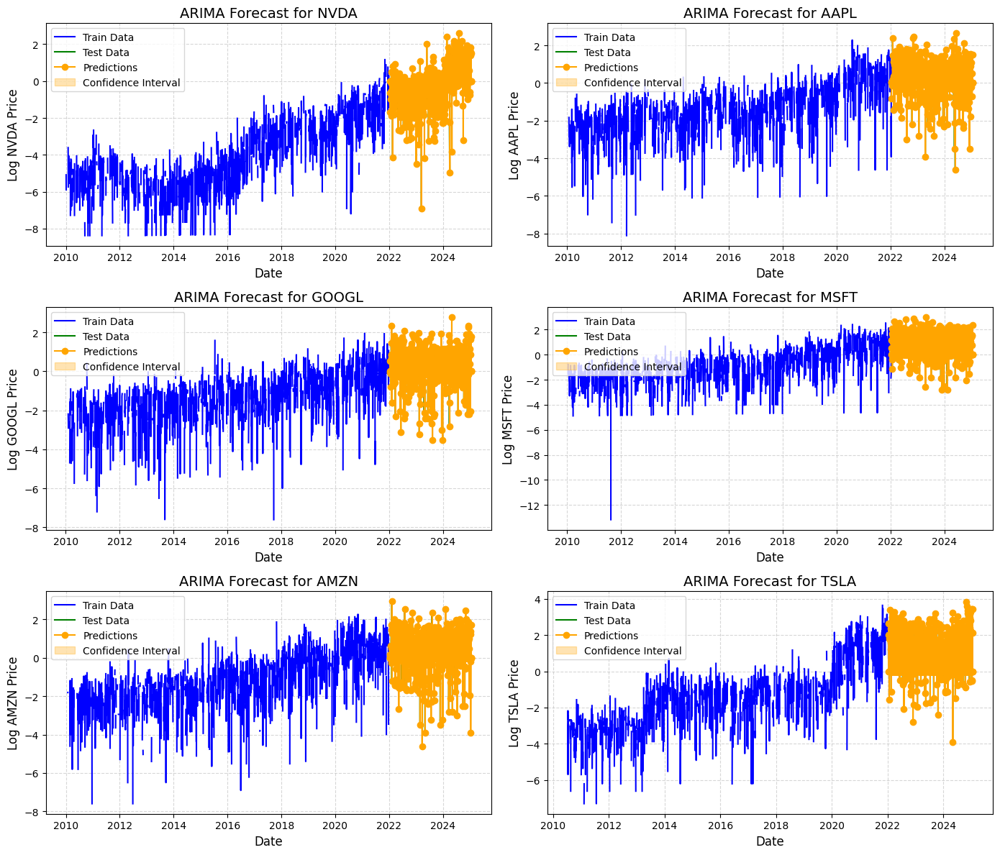

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

# Define tickers
# tickers = ['NVDA', 'AAPL', 'GOOGL', 'MSFT', 'AMZN', 'TSLA']

# Handle NaNs and Infinite values
for ticker in tickers:
    diff_price[ticker] = diff_price[ticker].replace([np.inf, -np.inf], np.nan)
    diff_price[ticker] = diff_price[ticker].fillna(method='ffill').fillna(method='bfill')
    diff_price[f'Log {ticker}'] = np.log(diff_price[ticker].replace(0, np.nan).fillna(method='ffill'))

# Train-test split
train_size = int(len(diff_price) * 0.8)

# Initialize dictionaries to store forecasts & confidence intervals
individual_forecasts = {ticker: [] for ticker in tickers}
conf_intervals = {ticker: [] for ticker in tickers}

for ticker in tickers:
    train_data = diff_price[f'Log {ticker}'].iloc[:train_size].dropna()
    test_data = diff_price[f'Log {ticker}'].iloc[train_size:]

    if len(train_data) < 50:
        print(f"Skipping {ticker} due to insufficient data ({len(train_data)} points).")
        continue

    print(f"\nFinding best ARIMA model for {ticker}...")
    auto_model = auto_arima(
        train_data, seasonal=False, trace=True, suppress_warnings=True, stepwise=True,
        max_p=5, max_q=5, max_d=2
    )

    fitted_model = ARIMA(train_data, order=auto_model.order).fit()

    # Generate individual predictions for test set
    for t in range(len(test_data)):
        forecast = fitted_model.get_forecast(steps=1)
        forecast_value = forecast.predicted_mean.iloc[0]
        individual_forecasts[ticker].append(forecast_value)
        conf_interval = forecast.conf_int().iloc[0]
        conf_intervals[ticker].append(conf_interval)

        # Update model with observed value (dynamic updating)
        fitted_model = fitted_model.apply(test_data.iloc[[t]])

    # Convert lists to Series for plotting
    individual_forecasts[ticker] = pd.Series(individual_forecasts[ticker], index=test_data.index)
    conf_intervals[ticker] = pd.DataFrame(conf_intervals[ticker], index=test_data.index, columns=['lower', 'upper'])

# Plot results
plt.figure(figsize=(14, 12))
for i, ticker in enumerate(tickers, 1):
    train_data = diff_price[f'Log {ticker}'].iloc[:train_size]
    test_data = diff_price[f'Log {ticker}'].iloc[train_size:]

    plt.subplot(3, 2, i)
    plt.plot(train_data, label='Train Data', color='blue')
    plt.plot(test_data, label='Test Data', color='green')
    plt.plot(individual_forecasts[ticker].index, individual_forecasts[ticker], 'o-', label='Predictions', color='orange')
    plt.fill_between(
        individual_forecasts[ticker].index,
        conf_intervals[ticker]['lower'],
        conf_intervals[ticker]['upper'],
        color='orange', alpha=0.3, label='Confidence Interval'
    )

    plt.title(f'ARIMA Forecast for {ticker}', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel(f'Log {ticker} Price', fontsize=12)
    plt.legend(loc='upper left', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


ARIMA Model Selection for Stock Prices
The provided output presents the results of the ARIMA model selection for six different stock prices: NVDA, AAPL, GOOGL, MSFT, AMZN, and TSLA. Here's a breakdown of the process:

**Objective:**

The goal is to find the best ARIMA (Autoregressive Integrated Moving Average) model for each stock price based on the data provided. ARIMA models are widely used for time series forecasting.

**Methodology:**

Stepwise Search: The process uses a "stepwise search" algorithm to minimize the AIC (Akaike Information Criterion). This criterion balances model complexity and goodness of fit.
AIC Minimization: The algorithm evaluates different combinations of AR, I, and MA parameters to find the model with the lowest AIC score, indicating the best balance of model complexity and accuracy.

**Results:**

For each stock, the output provides the following information:

**ARIMA Model:** The selected ARIMA model is presented in the format (p, d, q)(P, D, Q)[s], where:

**(p, d, q):** Autoregressive (AR), Integrated (I), and Moving Average (MA) parameters for the non-seasonal component.

**(P, D, Q)[s]:** Seasonal AR, I, and MA parameters with a seasonality of 's' periods. In this case, no seasonality is considered ([s]=0).

**intercept:** Indicates if a constant term (intercept) is included in the model.

**AIC**: The Akaike Information Criterion score for the selected model.

**Time:** The time taken for the model fitting process.

**Best Models:**

The output indicates the best ARIMA model for each stock as:

NVDA: ARIMA(0,1,1)(0,0,0)[0] intercept
AAPL: ARIMA(1,1,2)(0,0,0)[0] intercept
GOOGL: ARIMA(0,1,1)(0,0,0)[0] intercept
MSFT: ARIMA(0,1,1)(0,0,0)[0] intercept
AMZN: ARIMA(0,1,2)(0,0,0)[0] intercept
TSLA: ARIMA(0 ,1,1)(0,0,0)[0] intercept

**Analysis of Best Models:**

**NVDA:** The selected model ARIMA(0,1,1) suggests that the best fit involves one lag of the moving average component, indicating that past forecast errors are significant in predicting future values.

**AAPL:** The ARIMA(1,1,2) model indicates that both the autoregressive and moving average components are important, suggesting a more complex relationship in the data.

**GOOGL and MSFT:** Both stocks utilize the ARIMA(0,1,1) model, indicating a similar underlying structure in their price movements, where past errors are influential.

**AMZN:** The ARIMA(0,1,2) model suggests that two lags of the moving average component are necessary, indicating a more nuanced error structure.

**TSLA:** The ARIMA(0,1,1) model mirrors that of NVDA and MSFT, suggesting a straightforward relationship with past errors being the primary influence.

**Conclusion:**

The ARIMA model selection process for these stocks highlights the importance of understanding the underlying data structure. The chosen models reflect the unique characteristics of each stock's price movements, allowing for more accurate forecasting. The use of AIC as a criterion for model selection ensures that the models are not only fitting the data well but are also parsimonious, avoiding overfitting.

Diagnostics for NVDA:


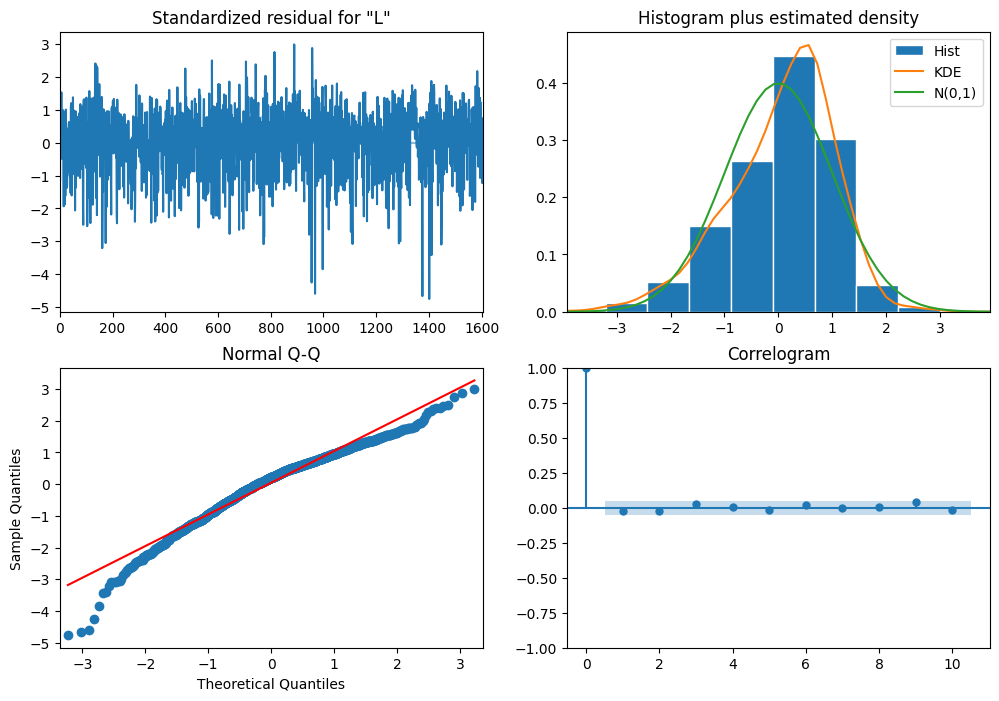

Diagnostics for AAPL:


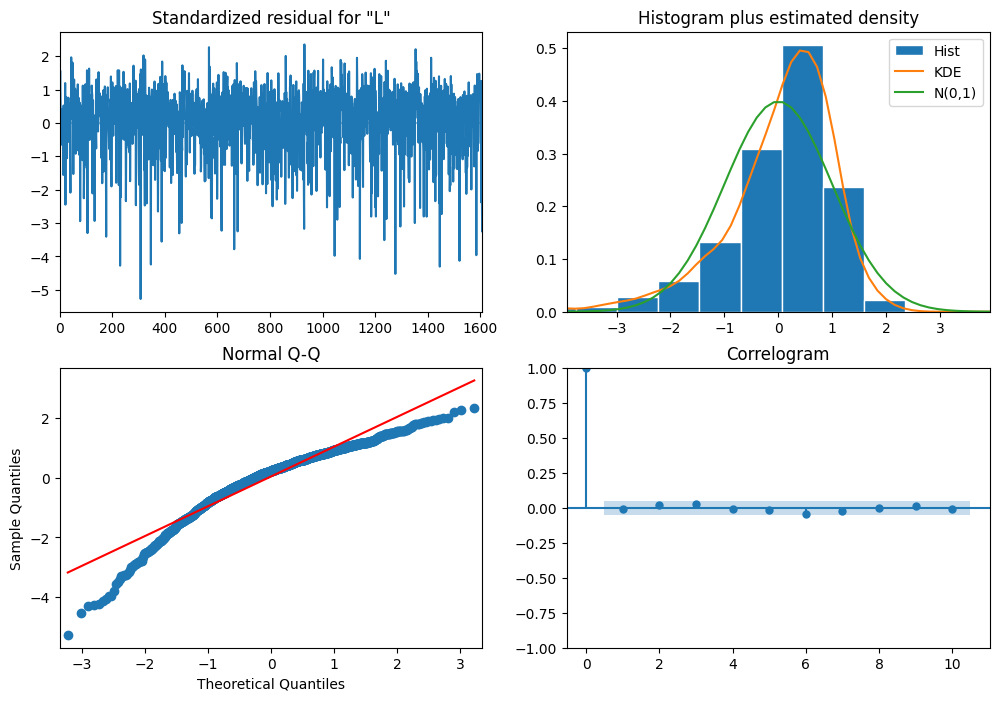

Diagnostics for GOOGL:


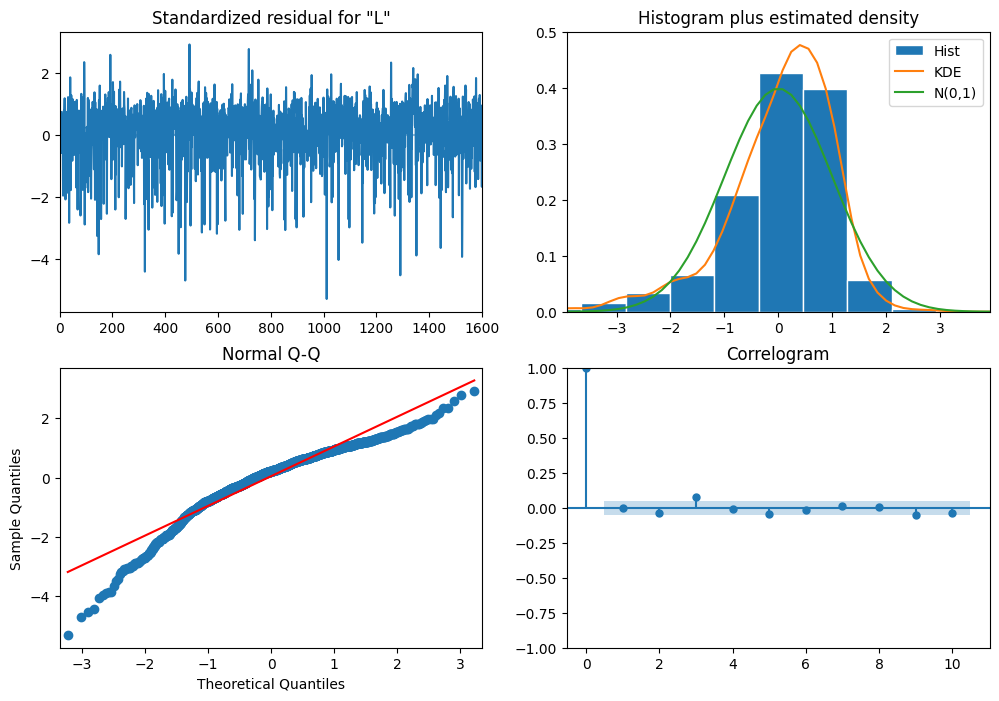

Diagnostics for MSFT:


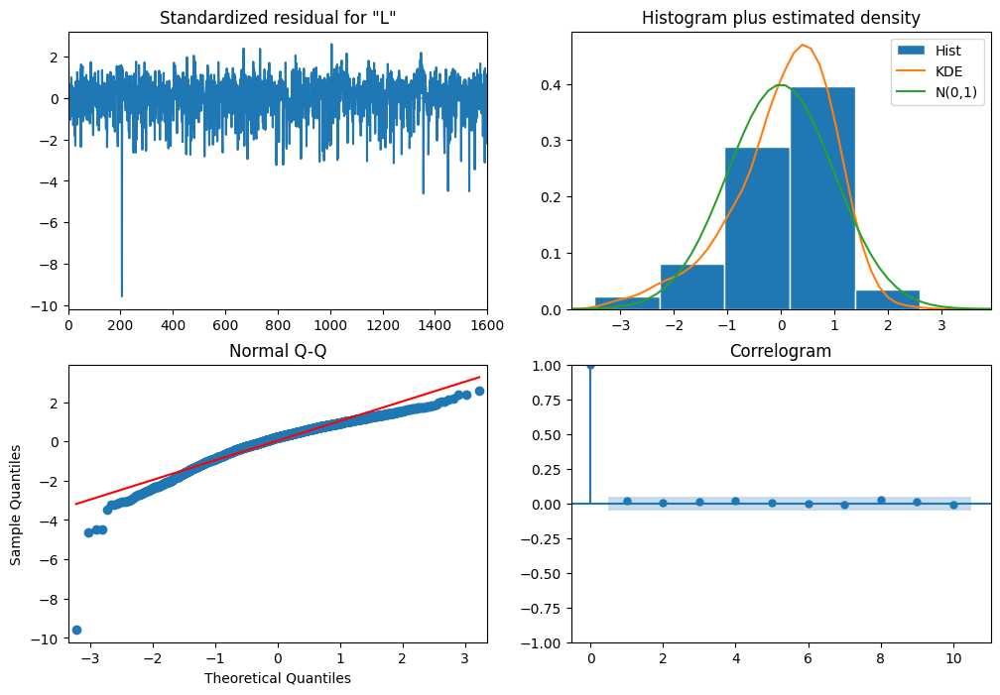

Diagnostics for AMZN:


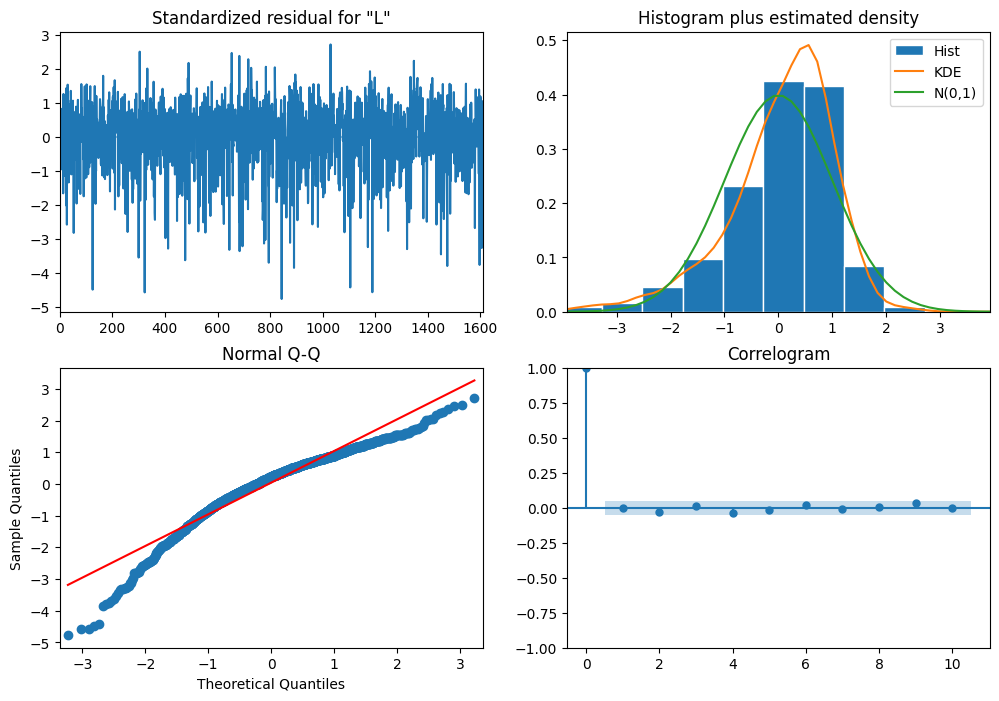

Diagnostics for TSLA:


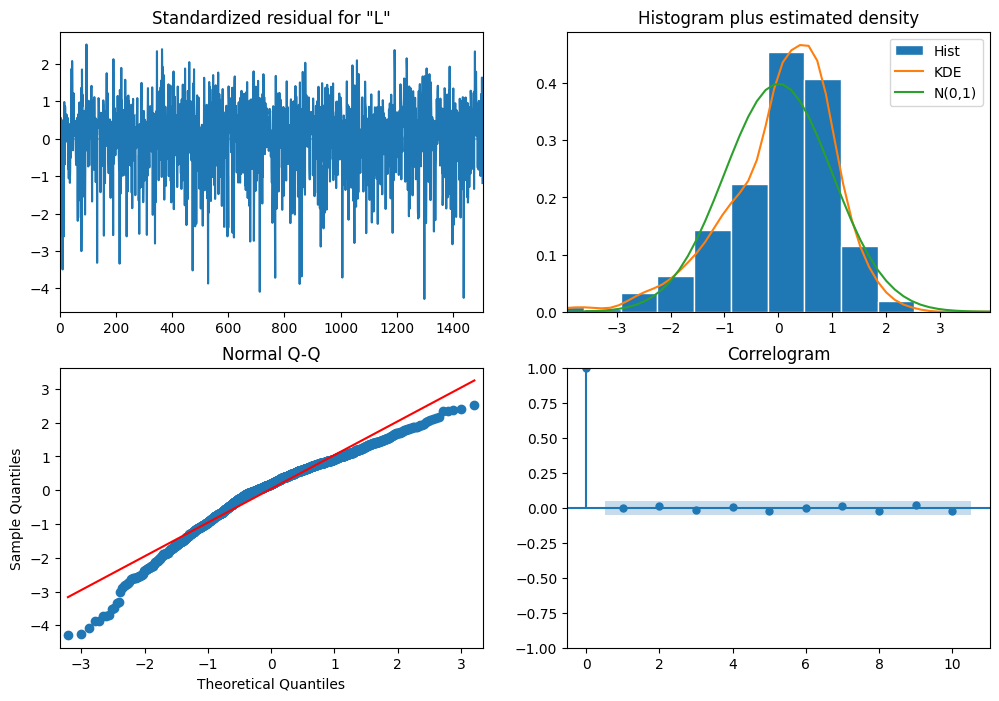

In [ ]:
for ticker, fitted_model_sp in fitted_models.items():
    print(f"Diagnostics for {ticker}:")
    fitted_model_sp.plot_diagnostics(figsize=(12, 8))
    plt.show()

# Vwap Calculation

Calculate VWAP   
VWAP is calculated using the formula:

$$
VWAP = Σ(Price × Volume) / Σ(Volume)
$$

VWAP provides an average price weighted by volume, useful for assessing trade execution quality.

In [ ]:
# Fetch previous historical intraday data
data = yf.download(tickers, interval='1m', period='1d')

[*********************100%***********************]  6 of 6 completed


In [ ]:
# Display the fetched data
print("Fetched Intraday Data:")
data.head()

Fetched Intraday Data:


Price                           Close                                      \
Ticker                           AAPL        AMZN       GOOGL        MSFT   
Datetime                                                                    
2025-02-07 14:30:00+00:00  232.737793  231.679993  190.419998  416.424988   
2025-02-07 14:31:00+00:00  233.434998  233.449997  190.189499  417.014008   
2025-02-07 14:32:00+00:00  233.039993  233.470001  190.205002  416.809998   
2025-02-07 14:33:00+00:00  233.210098  233.750000  190.365005  418.109985   
2025-02-07 14:34:00+00:00  233.409500  233.139999  190.630005  418.174988   

Price                                                    High              \
Ticker                           NVDA        TSLA        AAPL        AMZN   
Datetime                                                                    
2025-02-07 14:30:00+00:00  129.214996  371.809998  232.830002  232.750000   
2025-02-07 14:31:00+00:00  129.213898  374.420105  233.910004  233.559998   
2025-02-07 14:32:00+00:00  129.669998  376.757599  233.520004  234.300003   
2025-02-07 14:33:00+00:00  129.869995  376.700012  233.298096  233.949997   
2025-02-07 14:34:00+00:00  129.850403  376.295013  233.429993  233.718903   

Price                                              ...        Open  \
Ticker                          GOOGL        MSFT  ...       GOOGL   
Datetime                                           ...               
2025-02-07 14:30:00+00:00  191.000000  416.750000  ...  190.994995   
2025-02-07 14:31:00+00:00  190.779999  417.070007  ...  190.440002   
2025-02-07 14:32:00+00:00  190.559998  417.339996  ...  190.199997   
2025-02-07 14:33:00+00:00  190.449997  418.170013  ...  190.229996   
2025-02-07 14:34:00+00:00  190.779999  418.269989  ...  190.409897   

Price                                                          Volume  \
Ticker                           MSFT        NVDA        TSLA    AAPL   
Datetime                                                                
2025-02-07 14:30:00+00:00  416.480011  129.160004  370.179993  996701   
2025-02-07 14:31:00+00:00  416.420013  129.225494  371.809998  332244   
2025-02-07 14:32:00+00:00  417.239990  129.211197  374.549988  108137   
2025-02-07 14:33:00+00:00  416.829987  129.679993  376.811890   98988   
2025-02-07 14:34:00+00:00  418.109985  129.860001  376.750000  144030   

Price                                                                    
Ticker                        AMZN    GOOGL     MSFT      NVDA     TSLA  
Datetime                                                                 
2025-02-07 14:30:00+00:00  5181305  1114110  1115552  14772847  2907479  
2025-02-07 14:31:00+00:00  1011912   222873    79580   2061293   580607  
2025-02-07 14:32:00+00:00  1124201   286399    47823   1570936   740225  
2025-02-07 14:33:00+00:00   772282   148976    79670   1665849   387458  
2025-02-07 14:34:00+00:00   622300   163878    60883   3775867   386127  

[5 rows x 30 columns]

In [ ]:
# Ensure Volume is numeric for each ticker
for ticker in data.columns.levels[1]:  # Iterate through tickers
    # Skip empty tickers to avoid KeyError
    if ticker:
        data[('Volume', ticker)] = pd.to_numeric(data[('Volume', ticker)], errors='coerce')

# Calculate VWAP for each ticker
for ticker in data.columns.levels[1]:
    # Skip empty tickers to avoid KeyError
    if ticker:
        data[('Typical_Price', ticker)] = (data[('High', ticker)] + data[('Low', ticker)] + data[('Close', ticker)]) / 3
        data[('Cumulative_TPV', ticker)] = (data[('Typical_Price', ticker)] * data[('Volume', ticker)]).cumsum()
        data[('Cumulative_Volume', ticker)] = data[('Volume', ticker)].cumsum()
        data[('VWAP', ticker)] = data[('Cumulative_TPV', ticker)] / data[('Cumulative_Volume', ticker)]

# Drop unnecessary intermediate columns
# Skip empty tickers to avoid KeyError
valid_tickers = [t for t in data.columns.levels[1] if t]  # Get non-empty tickers
data.drop(columns=[('Cumulative_TPV', ticker) for ticker in valid_tickers] +
                  [('Cumulative_Volume', ticker) for ticker in valid_tickers], inplace=True)

# Display results
print(data.head())

Price                           Close                                      \
Ticker                           AAPL        AMZN       GOOGL        MSFT   
Datetime                                                                    
2025-02-07 14:30:00+00:00  232.737793  231.679993  190.419998  416.424988   
2025-02-07 14:31:00+00:00  233.434998  233.449997  190.189499  417.014008   
2025-02-07 14:32:00+00:00  233.039993  233.470001  190.205002  416.809998   
2025-02-07 14:33:00+00:00  233.210098  233.750000  190.365005  418.109985   
2025-02-07 14:34:00+00:00  233.409500  233.139999  190.630005  418.174988   

Price                                                    High              \
Ticker                           NVDA        TSLA        AAPL        AMZN   
Datetime                                                                    
2025-02-07 14:30:00+00:00  129.214996  371.809998  232.830002  232.750000   
2025-02-07 14:31:00+00:00  129.213898  374.420105  233.910004  233.559998  

In [ ]:
data.tail(5)

Price                           Close                                      \
Ticker                           AAPL        AMZN       GOOGL        MSFT   
Datetime                                                                    
2025-02-07 20:55:00+00:00  227.679993  228.919998  185.235001  410.010010   
2025-02-07 20:56:00+00:00  227.770004  229.086395  185.270004  410.170013   
2025-02-07 20:57:00+00:00  227.789993  229.270004  185.341797  410.209991   
2025-02-07 20:58:00+00:00  227.684998  229.190002  185.320007  409.910004   
2025-02-07 20:59:00+00:00  227.710007  229.270004  185.350006  409.760010   

Price                                                    High              \
Ticker                           NVDA        TSLA        AAPL        AMZN   
Datetime                                                                    
2025-02-07 20:55:00+00:00  129.744995  362.130005  227.830002  229.849899   
2025-02-07 20:56:00+00:00  129.799896  361.769989  227.830002  229.100006   
2025-02-07 20:57:00+00:00  129.860199  361.589996  227.835007  229.330002   
2025-02-07 20:58:00+00:00  129.889999  361.320007  227.800003  229.330002   
2025-02-07 20:59:00+00:00  129.860001  361.489990  227.779999  229.479996   

Price                                              ... Typical_Price  \
Ticker                          GOOGL        MSFT  ...          AMZN   
Datetime                                           ...                 
2025-02-07 20:55:00+00:00  185.389999  410.200012  ...    229.159968   
2025-02-07 20:56:00+00:00  185.289993  410.200012  ...    229.002136   
2025-02-07 20:57:00+00:00  185.350006  410.299988  ...    229.200002   
2025-02-07 20:58:00+00:00  185.350006  410.220001  ...    229.220001   
2025-02-07 20:59:00+00:00  185.419998  410.130005  ...    229.250000   

Price                            VWAP Typical_Price        VWAP Typical_Price  \
Ticker                           AMZN         GOOGL       GOOGL          MSFT   
Datetime                                                                        
2025-02-07 20:55:00+00:00  230.649484    185.255000  186.229793    409.903341   
2025-02-07 20:56:00+00:00  230.642188    185.253332  186.225822    410.116679   
2025-02-07 20:57:00+00:00  230.636263    185.307866  186.220724    410.203328   
2025-02-07 20:58:00+00:00  230.629568    185.310003  186.214452    409.991669   
2025-02-07 20:59:00+00:00  230.611953    185.343333  186.202550    409.880005   

Price                            VWAP Typical_Price        VWAP Typical_Price  \
Ticker                           MSFT          NVDA        NVDA          TSLA   
Datetime                                                                        
2025-02-07 20:55:00+00:00  411.886913    129.718333  129.011711    362.000000   
2025-02-07 20:56:00+00:00  411.873242    129.766632  129.014551    361.793325   
2025-02-07 20:57:00+00:00  411.859747    129.850062  129.019027    361.576630   
2025-02-07 20:58:00+00:00  411.845641    129.881668  129.025247    361.413310   
2025-02-07 20:59:00+00:00  411.781076    129.903336  129.039879    361.367900   

Price                            VWAP  
Ticker                           TSLA  
Datetime                               
2025-02-07 20:55:00+00:00  369.374649  
2025-02-07 20:56:00+00:00  369.347323  
2025-02-07 20:57:00+00:00  369.307424  
2025-02-07 20:58:00+00:00  369.262947  
2025-02-07 20:59:00+00:00  369.171780  

[5 rows x 42 columns]

Calculate Rolling VWAP

Rolling VWAP smooths the VWAP over a specified period, helping to identify trends.

To calculate a rolling VWAP, you can specify a window size (e.g., 14 days):

In [ ]:
# Calculate Rolling VWAP (14-day) for each ticker
for tickers in data.columns.levels[1]:
    # Skip empty tickers to avoid KeyError
    if tickers:
        data[('Rolling VWAP', ticker)] = data[('VWAP', ticker)].rolling(window=14).mean()

In [ ]:
data.columns

MultiIndex([(        'Close',  'AAPL'),
            (        'Close',  'AMZN'),
            (        'Close', 'GOOGL'),
            (        'Close',  'MSFT'),
            (        'Close',  'NVDA'),
            (        'Close',  'TSLA'),
            (         'High',  'AAPL'),
            (         'High',  'AMZN'),
            (         'High', 'GOOGL'),
            (         'High',  'MSFT'),
            (         'High',  'NVDA'),
            (         'High',  'TSLA'),
            (          'Low',  'AAPL'),
            (          'Low',  'AMZN'),
            (          'Low', 'GOOGL'),
            (          'Low',  'MSFT'),
            (          'Low',  'NVDA'),
            (          'Low',  'TSLA'),
            (         'Open',  'AAPL'),
            (         'Open',  'AMZN'),
            (         'Open', 'GOOGL'),
            (         'Open',  'MSFT'),
            (         'Open',  'NVDA'),
            (         'Open',  'TSLA'),
            (       'Volume',  'AAPL'),


Processing T...


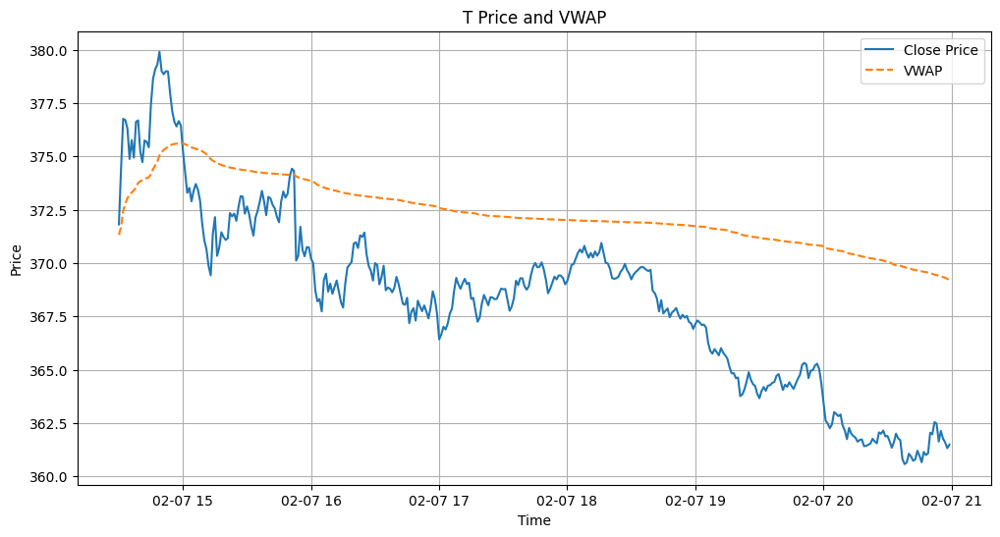

Processing S...


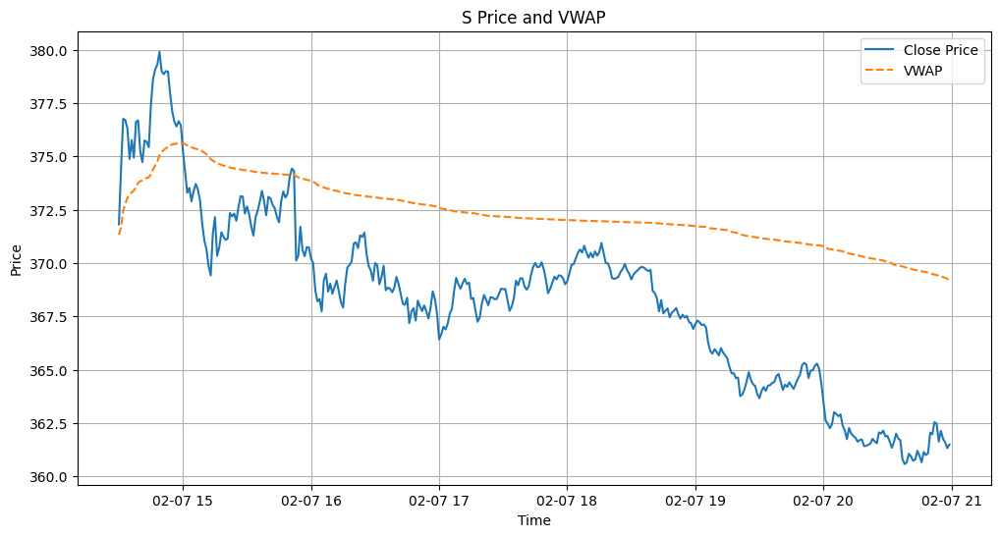

Processing L...


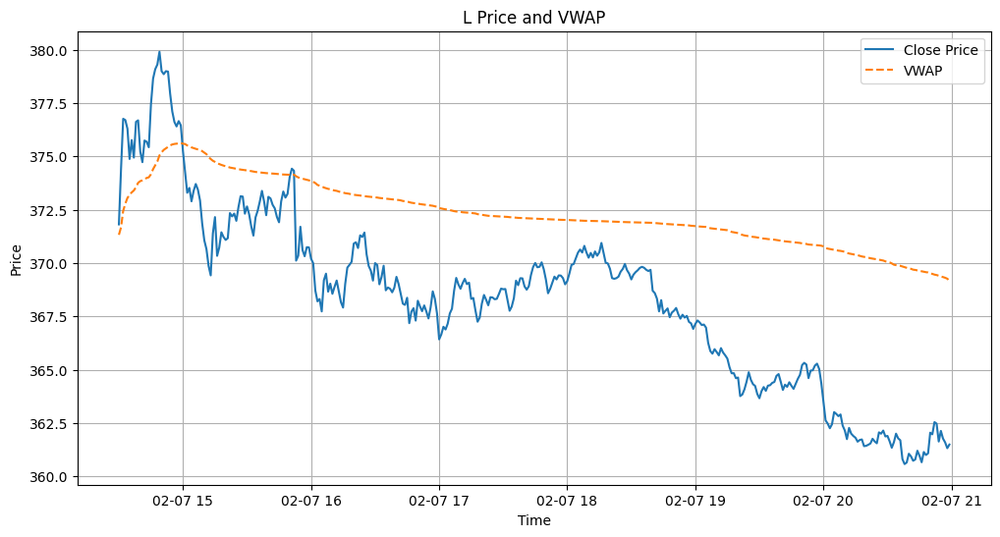

Processing A...


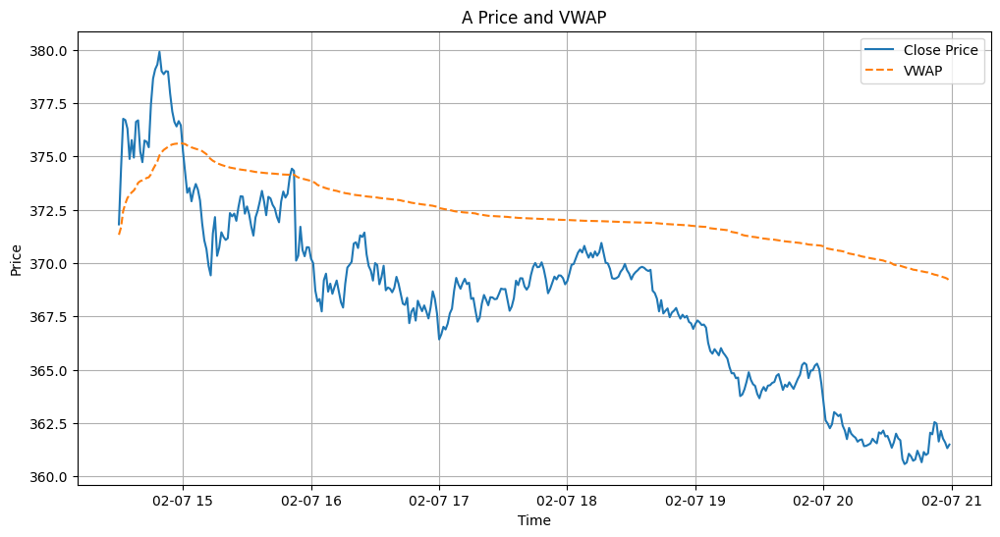

   Total Return (%)  Maximum Drawdown (%)  Sharpe Ratio       VWAP
T         -2.775613             -3.021889       -0.7418  369.17178
S         -2.775613             -3.021889       -0.7418  369.17178
L         -2.775613             -3.021889       -0.7418  369.17178
A         -2.775613             -3.021889       -0.7418  369.17178


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Initialize a dictionary to store results
results = {}

# Loop through each ticker and calculate VWAP
for ticker in tickers:
    print(f"Processing {ticker}...")

    # Ensure previous historical intraday data is used
    df = data.xs(tickers, level='Ticker', axis=1).copy()  # Extract ticker-specific data

    # Ensure volume is numeric
    df['Volume'] = pd.to_numeric(df['Volume'], errors='coerce')

    # Calculate VWAP
    df['Typical_Price'] = (df['High'] + df['Low'] + df['Close']) / 3
    df['Cumulative_TPV'] = (df['Typical_Price'] * df['Volume']).cumsum()
    df['Cumulative_Volume'] = df['Volume'].cumsum()
    df['VWAP'] = df['Cumulative_TPV'] / df['Cumulative_Volume']

    # Generate buy/sell signals
    df['Signal'] = np.where(df['Close'] > df['VWAP'], 1, 0)
    df['Position'] = df['Signal'].diff()

    # Calculate performance metrics
    total_return = (df['Close'].iloc[-1] - df['Close'].iloc[0]) / df['Close'].iloc[0] * 100
    max_drawdown = (df['Close'].min() - df['Close'].iloc[0]) / df['Close'].iloc[0] * 100
    sharpe_ratio = (df['Close'].pct_change().mean() / df['Close'].pct_change().std()) * np.sqrt(252)

    # Store results
    results[ticker] = {
        'Total Return (%)': total_return,
        'Maximum Drawdown (%)': max_drawdown,
        'Sharpe Ratio': sharpe_ratio,
        'VWAP': df['VWAP'].iloc[-1]
    }

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(df['Close'], label='Close Price')
    plt.plot(df['VWAP'], label='VWAP', linestyle='--')
    plt.title(f'{ticker} Price and VWAP')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.grid()
    plt.show()

# Convert results to DataFrame for better visualization
results_df = pd.DataFrame(results).T
print(results_df)


In [ ]:
data.tail(n=5)

Price                           Close                                      \
Ticker                           AAPL        AMZN       GOOGL        MSFT   
Datetime                                                                    
2025-02-07 20:55:00+00:00  227.679993  228.919998  185.235001  410.010010   
2025-02-07 20:56:00+00:00  227.770004  229.086395  185.270004  410.170013   
2025-02-07 20:57:00+00:00  227.789993  229.270004  185.341797  410.209991   
2025-02-07 20:58:00+00:00  227.684998  229.190002  185.320007  409.910004   
2025-02-07 20:59:00+00:00  227.710007  229.270004  185.350006  409.760010   

Price                                                    High              \
Ticker                           NVDA        TSLA        AAPL        AMZN   
Datetime                                                                    
2025-02-07 20:55:00+00:00  129.744995  362.130005  227.830002  229.849899   
2025-02-07 20:56:00+00:00  129.799896  361.769989  227.830002  229.100006   
2025-02-07 20:57:00+00:00  129.860199  361.589996  227.835007  229.330002   
2025-02-07 20:58:00+00:00  129.889999  361.320007  227.800003  229.330002   
2025-02-07 20:59:00+00:00  129.860001  361.489990  227.779999  229.479996   

Price                                              ...        VWAP  \
Ticker                          GOOGL        MSFT  ...        AMZN   
Datetime                                           ...               
2025-02-07 20:55:00+00:00  185.389999  410.200012  ...  230.649484   
2025-02-07 20:56:00+00:00  185.289993  410.200012  ...  230.642188   
2025-02-07 20:57:00+00:00  185.350006  410.299988  ...  230.636263   
2025-02-07 20:58:00+00:00  185.350006  410.220001  ...  230.629568   
2025-02-07 20:59:00+00:00  185.419998  410.130005  ...  230.611953   

Price                     Typical_Price        VWAP Typical_Price        VWAP  \
Ticker                            GOOGL       GOOGL          MSFT        MSFT   
Datetime                                                                        
2025-02-07 20:55:00+00:00    185.255000  186.229793    409.903341  411.886913   
2025-02-07 20:56:00+00:00    185.253332  186.225822    410.116679  411.873242   
2025-02-07 20:57:00+00:00    185.307866  186.220724    410.203328  411.859747   
2025-02-07 20:58:00+00:00    185.310003  186.214452    409.991669  411.845641   
2025-02-07 20:59:00+00:00    185.343333  186.202550    409.880005  411.781076   

Price                     Typical_Price        VWAP Typical_Price        VWAP  \
Ticker                             NVDA        NVDA          TSLA        TSLA   
Datetime                                                                        
2025-02-07 20:55:00+00:00    129.718333  129.011711    362.000000  369.374649   
2025-02-07 20:56:00+00:00    129.766632  129.014551    361.793325  369.347323   
2025-02-07 20:57:00+00:00    129.850062  129.019027    361.576630  369.307424   
2025-02-07 20:58:00+00:00    129.881668  129.025247    361.413310  369.262947   
2025-02-07 20:59:00+00:00    129.903336  129.039879    361.367900  369.171780   

Price                     Rolling VWAP  
Ticker                            TSLA  
Datetime                                
2025-02-07 20:55:00+00:00   369.545523  
2025-02-07 20:56:00+00:00   369.521257  
2025-02-07 20:57:00+00:00   369.495143  
2025-02-07 20:58:00+00:00   369.467330  
2025-02-07 20:59:00+00:00   369.434288  

[5 rows x 43 columns]

### Perform Technical Analysis (e.g., Moving Averages, RSI)

Calculate RSI

RSI indicates overbought or oversold conditions, aiding in decision-making for buying or selling.

RSI is calculated using the following steps:

1. Calculate the price changes.
2. Separate gains and losses.
3. Calculate the average gain and average loss.
4. Calculate the RS (Relative Strength).
5. Calculate the RSI.


In [ ]:
# # Calculate RSI for each ticker and store it in the 'data' DataFrame
# for ticker in tickers:
#     delta = data[('Close', ticker)].diff()
#     gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
#     loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
#     rs = gain / loss
#     data[('RSI', ticker)] = 100 - (100 / (1 + rs))  # Assign to a MultiIndex column

In [ ]:
data.tail()

Price                           Close                                      \
Ticker                           AAPL        AMZN       GOOGL        MSFT   
Datetime                                                                    
2025-02-07 20:55:00+00:00  227.679993  228.919998  185.235001  410.010010   
2025-02-07 20:56:00+00:00  227.770004  229.086395  185.270004  410.170013   
2025-02-07 20:57:00+00:00  227.789993  229.270004  185.341797  410.209991   
2025-02-07 20:58:00+00:00  227.684998  229.190002  185.320007  409.910004   
2025-02-07 20:59:00+00:00  227.710007  229.270004  185.350006  409.760010   

Price                                                    High              \
Ticker                           NVDA        TSLA        AAPL        AMZN   
Datetime                                                                    
2025-02-07 20:55:00+00:00  129.744995  362.130005  227.830002  229.849899   
2025-02-07 20:56:00+00:00  129.799896  361.769989  227.830002  229.100006   
2025-02-07 20:57:00+00:00  129.860199  361.589996  227.835007  229.330002   
2025-02-07 20:58:00+00:00  129.889999  361.320007  227.800003  229.330002   
2025-02-07 20:59:00+00:00  129.860001  361.489990  227.779999  229.479996   

Price                                              ...        VWAP  \
Ticker                          GOOGL        MSFT  ...        AMZN   
Datetime                                           ...               
2025-02-07 20:55:00+00:00  185.389999  410.200012  ...  230.649484   
2025-02-07 20:56:00+00:00  185.289993  410.200012  ...  230.642188   
2025-02-07 20:57:00+00:00  185.350006  410.299988  ...  230.636263   
2025-02-07 20:58:00+00:00  185.350006  410.220001  ...  230.629568   
2025-02-07 20:59:00+00:00  185.419998  410.130005  ...  230.611953   

Price                     Typical_Price        VWAP Typical_Price        VWAP  \
Ticker                            GOOGL       GOOGL          MSFT        MSFT   
Datetime                                                                        
2025-02-07 20:55:00+00:00    185.255000  186.229793    409.903341  411.886913   
2025-02-07 20:56:00+00:00    185.253332  186.225822    410.116679  411.873242   
2025-02-07 20:57:00+00:00    185.307866  186.220724    410.203328  411.859747   
2025-02-07 20:58:00+00:00    185.310003  186.214452    409.991669  411.845641   
2025-02-07 20:59:00+00:00    185.343333  186.202550    409.880005  411.781076   

Price                     Typical_Price        VWAP Typical_Price        VWAP  \
Ticker                             NVDA        NVDA          TSLA        TSLA   
Datetime                                                                        
2025-02-07 20:55:00+00:00    129.718333  129.011711    362.000000  369.374649   
2025-02-07 20:56:00+00:00    129.766632  129.014551    361.793325  369.347323   
2025-02-07 20:57:00+00:00    129.850062  129.019027    361.576630  369.307424   
2025-02-07 20:58:00+00:00    129.881668  129.025247    361.413310  369.262947   
2025-02-07 20:59:00+00:00    129.903336  129.039879    361.367900  369.171780   

Price                     Rolling VWAP  
Ticker                            TSLA  
Datetime                                
2025-02-07 20:55:00+00:00   369.545523  
2025-02-07 20:56:00+00:00   369.521257  
2025-02-07 20:57:00+00:00   369.495143  
2025-02-07 20:58:00+00:00   369.467330  
2025-02-07 20:59:00+00:00   369.434288  

[5 rows x 43 columns]

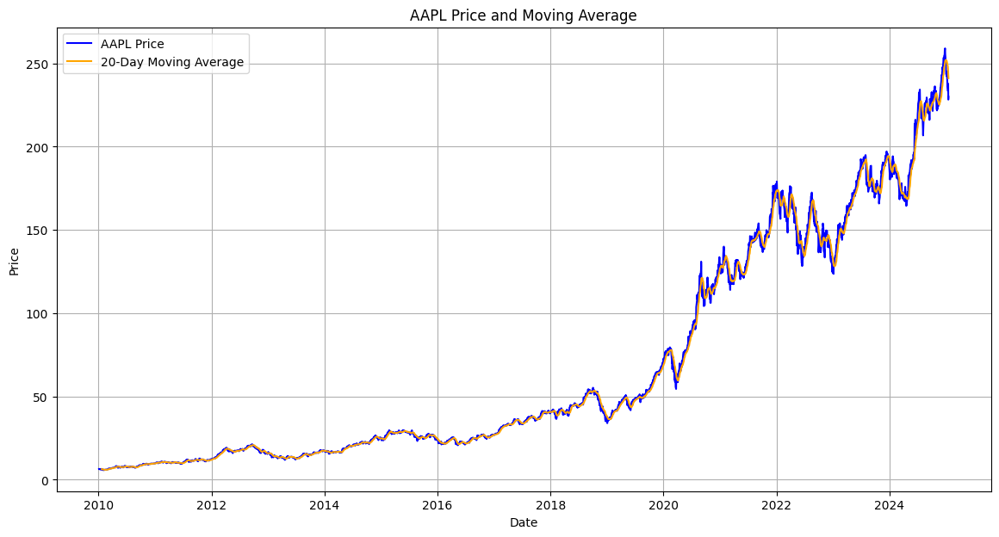

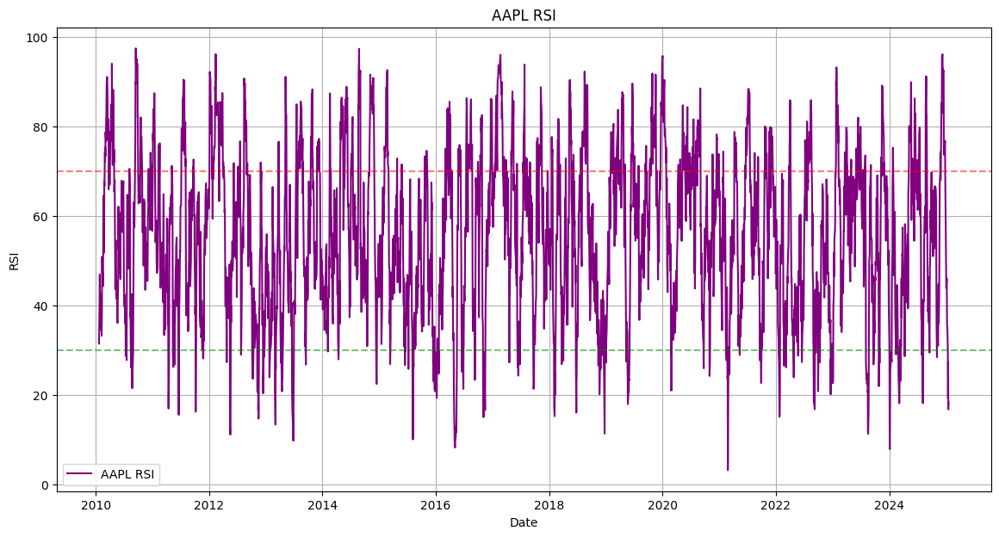

In [ ]:
# Calculate moving averages
moving_average = price_data.rolling(window=14).mean()

# Calculate RSI (Relative Strength Index)
def calculate_rsi(data, window=14):
    delta = data.diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

rsi_data = price_data.apply(calculate_rsi)

# Plotting Moving Averages and RSI for AAPL
plt.figure(figsize=(14, 7))
plt.plot(price_data['AAPL'], label='AAPL Price', color='blue')
plt.plot(moving_average['AAPL'], label='20-Day Moving Average', color='orange')
plt.title('AAPL Price and Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid()
plt.show()

# Plotting RSI
plt.figure(figsize=(14, 7))
plt.plot(rsi_data['AAPL'], label='AAPL RSI', color='purple')
plt.axhline(70, linestyle='--', alpha=0.5, color='red')
plt.axhline(30, linestyle='--', alpha=0.5, color='green')
plt.title('AAPL RSI')
plt.xlabel('Date')
plt.ylabel('RSI')
plt.legend()
plt.grid()
plt.show()

**RSI Chart**

**RSI Values:** The RSI oscillates between 0 and 100, indicating the strength of price movements.
**Overbought and Oversold Levels:** The horizontal lines at 70 and 30 represent the overbought and oversold levels, respectively.

**Interpretation:**
When the RSI crosses above 70, it suggests that the stock might be overbought and due for a correction.
Conversely, when the RSI crosses below 30, it suggests that the stock might be oversold and a potential bounce back is possible.
Price and Moving Average Chart

**Price Action:** The blue line represents the price of Apple stock over time, showcasing its overall trend.

**20-Day Moving Average:** The orange line represents the 20-day moving average, which is a commonly used technical indicator that smooths out price fluctuations.

**Interpretation:**
The 20-day moving average can be used to identify potential trends and support/resistance levels.
When the price crosses above the moving average, it can be interpreted as a bullish signal, while crossing below it suggests bearish momentum.
Observations and Insights

**Long-Term Trend:** Both charts indicate a general upward trend in Apple's stock price over time.

**Short-Term Volatility:** The RSI chart suggests that the stock has experienced periods of overbought and oversold conditions, highlighting its short-term volatility.

**Price and Moving Average Relationship:** The price chart shows that the stock price tends to stay close to the 20-day moving average, indicating that it serves as a support level.

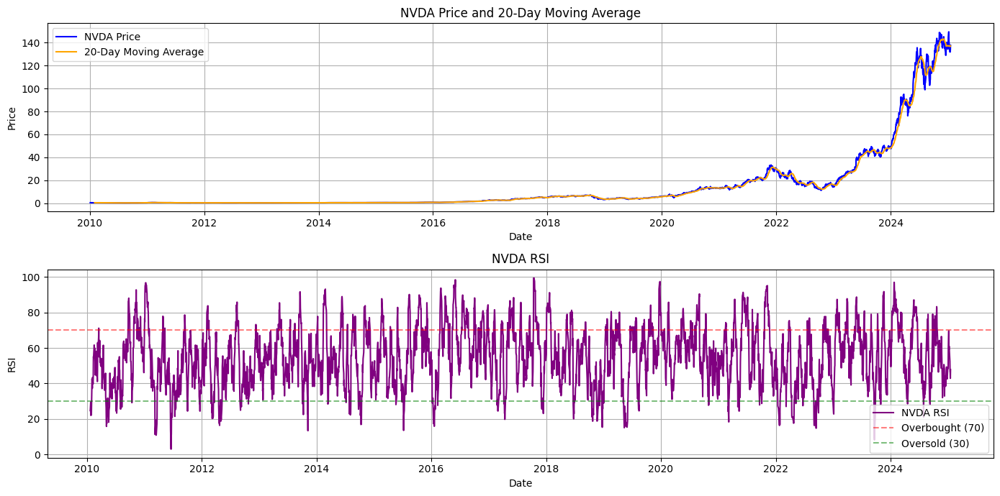

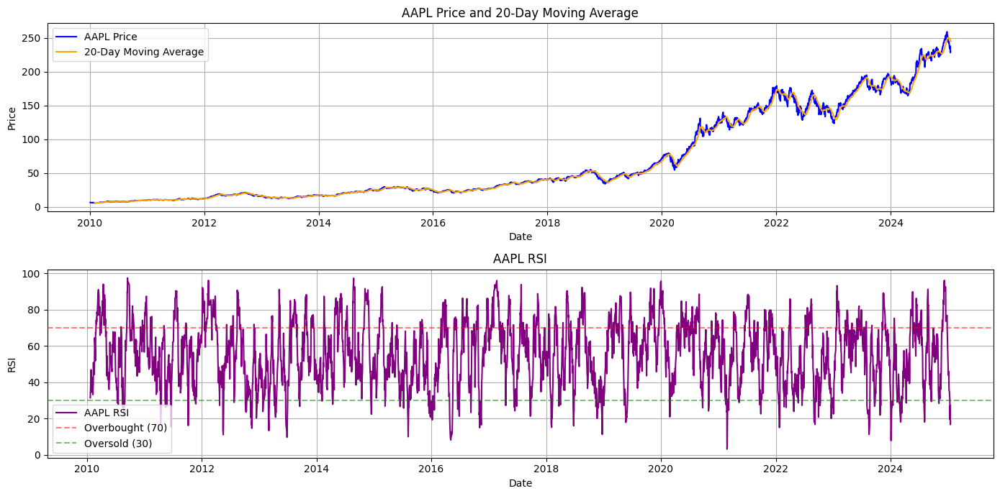

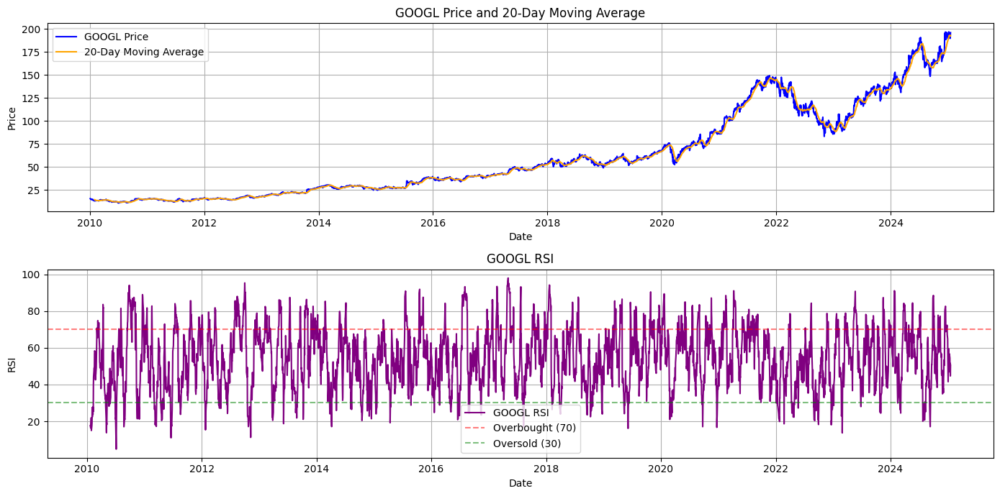

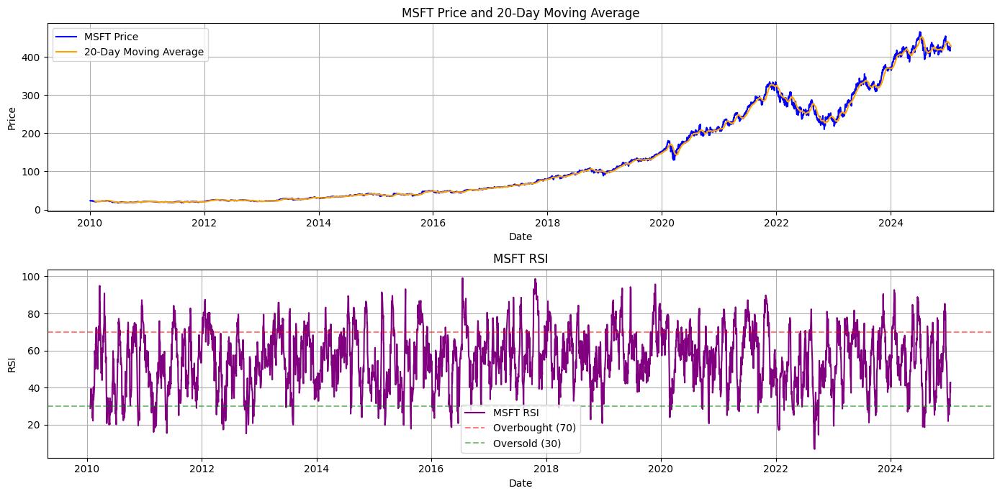

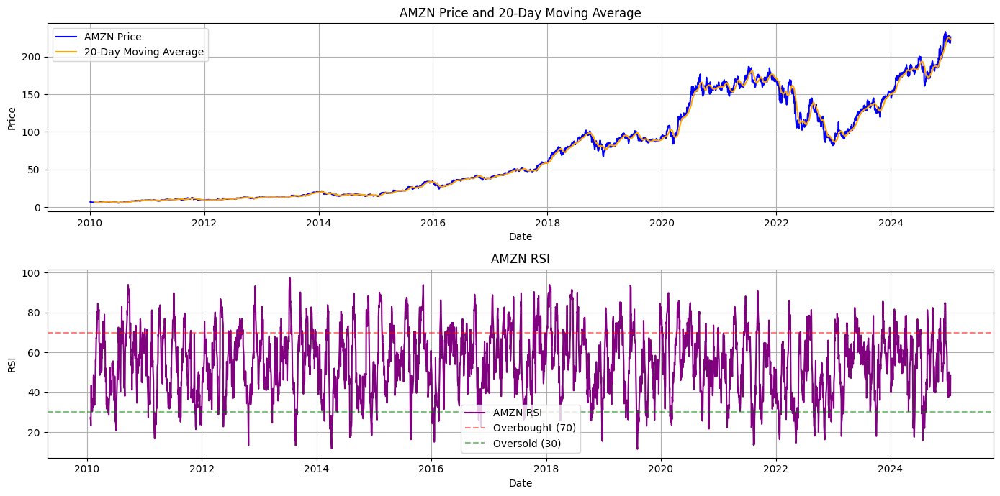

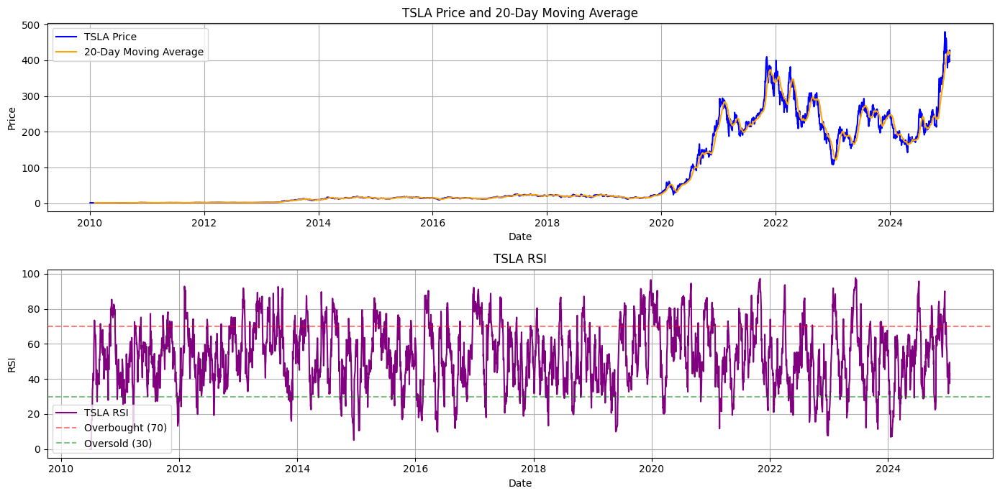

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define tickers
tickers = ['NVDA', 'AAPL', 'GOOGL', 'MSFT', 'AMZN', 'TSLA']

# Calculate moving averages (20-day window)
moving_average = price_data.rolling(window=20).mean()

# Calculate RSI (Relative Strength Index)
def calculate_rsi(data, window=14):
    delta = data.diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

rsi_data = price_data.apply(calculate_rsi)

# Plot Moving Averages and RSI for each ticker
for ticker in tickers:
    plt.figure(figsize=(14, 7))

    # Plot Price and Moving Average
    plt.subplot(2, 1, 1)
    plt.plot(price_data[ticker], label=f'{ticker} Price', color='blue')
    plt.plot(moving_average[ticker], label=f'20-Day Moving Average', color='orange')
    plt.title(f'{ticker} Price and 20-Day Moving Average')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid()

    # Plot RSI
    plt.subplot(2, 1, 2)
    plt.plot(rsi_data[ticker], label=f'{ticker} RSI', color='purple')
    plt.axhline(70, linestyle='--', alpha=0.5, color='red', label='Overbought (70)')
    plt.axhline(30, linestyle='--', alpha=0.5, color='green', label='Oversold (30)')
    plt.title(f'{ticker} RSI')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()


Create a Portfolio Analysis

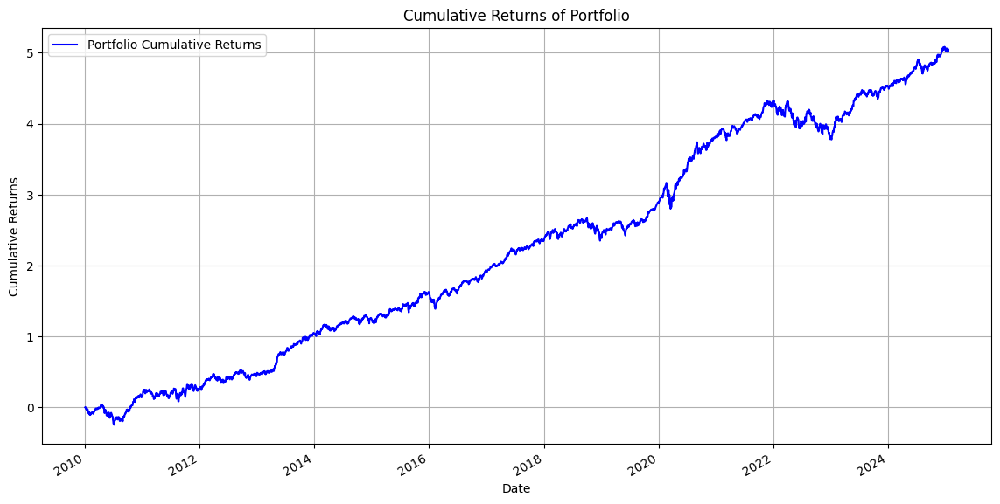

In [ ]:
# Portfolio weights (equal allocation)
weights = [1/len(tickers)] * len(tickers)

# Calculate portfolio returns
portfolio_returns = (Returns * weights).sum(axis=1)

# Plotting portfolio returns
plt.figure(figsize=(14, 7))
portfolio_returns.cumsum().plot(label='Portfolio Cumulative Returns', color='blue')
plt.title('Cumulative Returns of Portfolio')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid()
plt.show()

## Trading Strategy:

Buy Signal: When the stock price crosses above the VWAP, indicating bullish sentiment.     
Sell Signal: When the stock price crosses below the VWAP, indicating bearish sentiment.

## Trading Simulation

Implement a backtesting framework to simulate trades based on the VWAP signals. Track the performance of each stock by calculating the following metrics:

**Total Return:**
The percentage change in stock price from the beginning to the end of the trading period.

**Maximum Drawdown:** The largest drop from a peak to a trough in the stock price.

**Sharpe Ratio:** A measure of risk-adjusted return, calculated as the mean return divided by the standard deviation of returns.

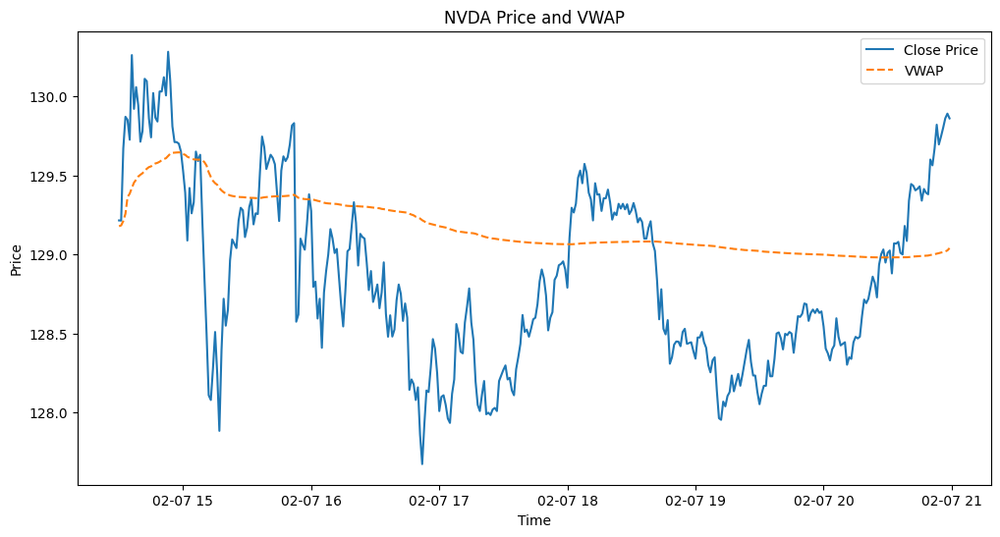

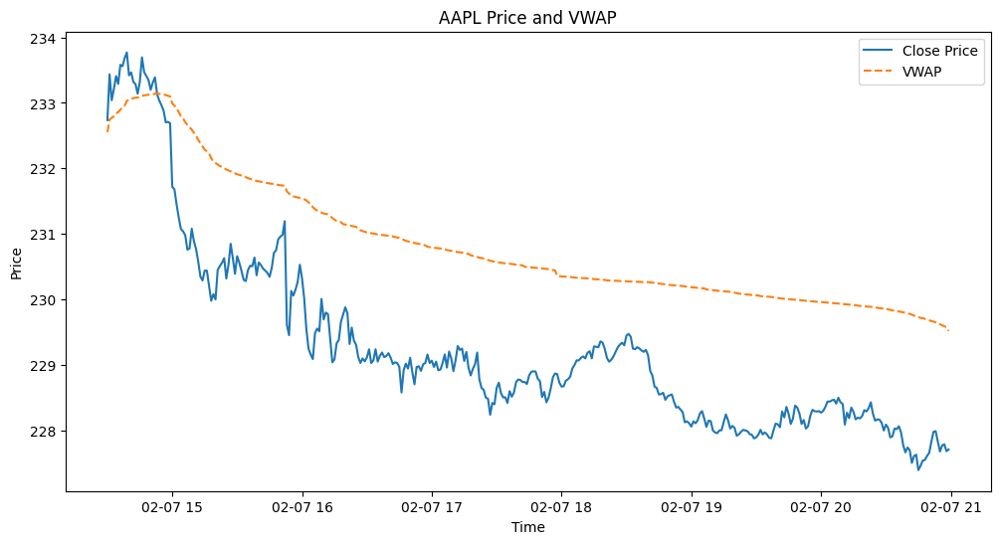

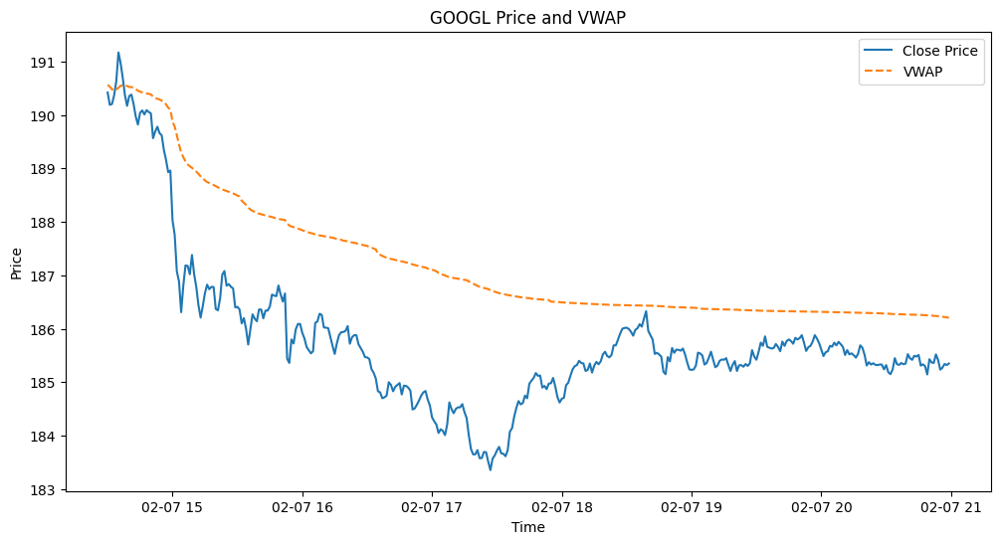

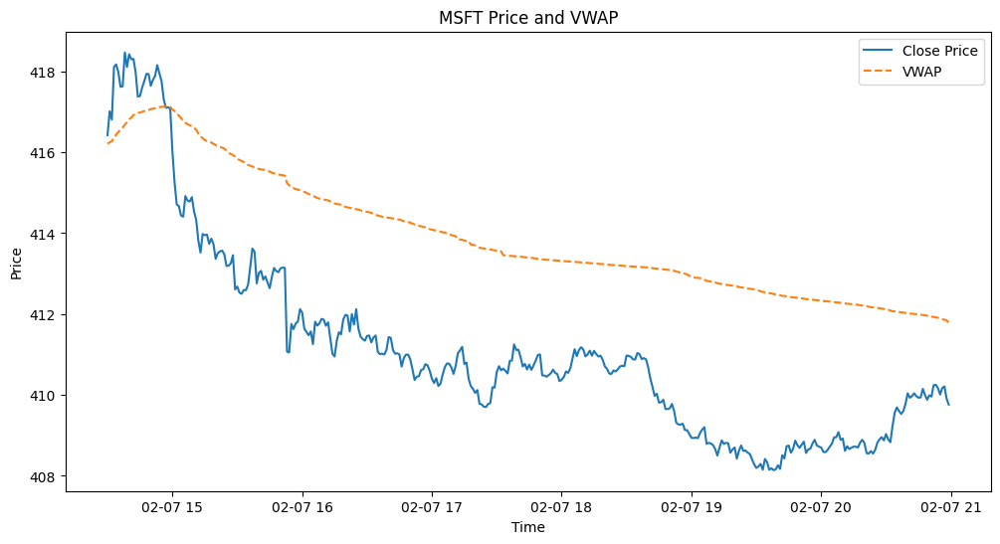

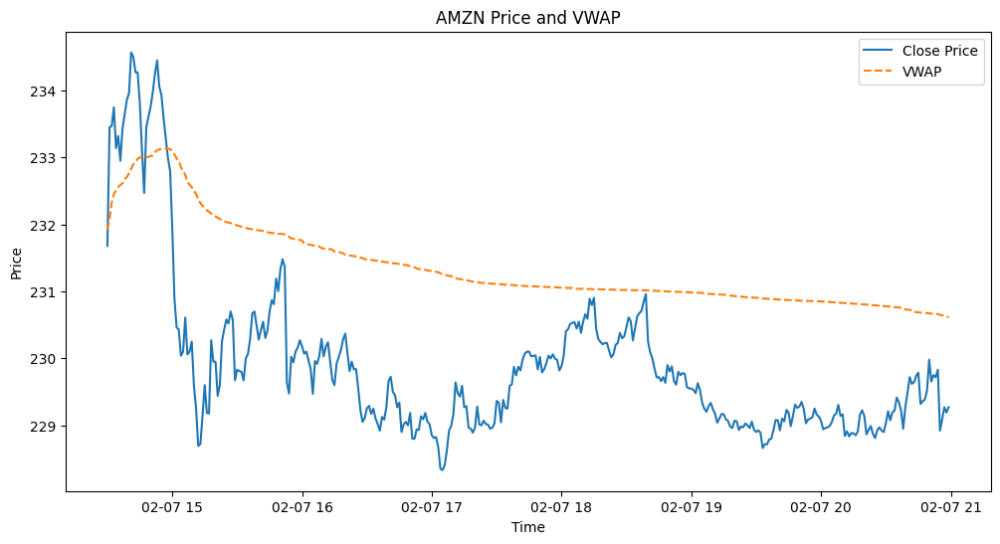

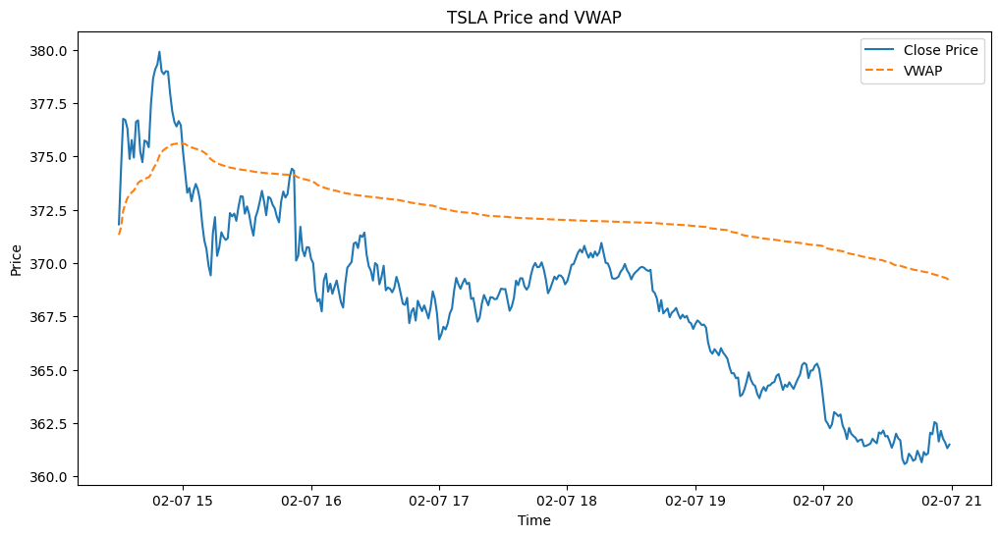

       Total Return (%)  Maximum Drawdown (%)  Sharpe Ratio
NVDA           0.499171             -1.191807      0.174161
AAPL          -2.160279             -2.295626     -1.149048
GOOGL         -2.662531             -3.710221     -1.175503
MSFT          -1.600523             -1.989548     -1.109088
AMZN          -1.040223             -1.445614     -0.361047
TSLA          -2.775613             -3.021889     -0.741800


In [ ]:
# Initialize a dictionary to store results
performance_metrics = {}

# Loop through each ticker to fetch data and calculate VWAP
for ticker in tickers:
    # Fetch historical intraday data (commented out for now)
    # data = yf.download(ticker, interval='1m', period='1d')

    # Generate buy/sell signals for each ticker individually
    data[('Signal', ticker)] = 0  # Create a Signal column for each ticker
    data[('Signal', ticker)][1:] = np.where(data[('Close', ticker)][1:] > data[('VWAP', ticker)][1:], 1, 0)  # Access data using MultiIndex
    data[('Position', ticker)] = data[('Signal', ticker)].diff()

    # Calculate performance metrics for each ticker
    total_return = (data[('Close', ticker)].iloc[-1] - data[('Close', ticker)].iloc[0]) / data[('Close', ticker)].iloc[0] * 100
    max_drawdown = (data[('Close', ticker)].min() - data[('Close', ticker)].iloc[0]) / data[('Close', ticker)].iloc[0] * 100
    sharpe_ratio = (data[('Close', ticker)].pct_change().mean() / data[('Close', ticker)].pct_change().std()) * np.sqrt(252)

    # Store results for each ticker
    performance_metrics[ticker] = {
        'Total Return (%)': total_return,
        'Maximum Drawdown (%)': max_drawdown,
        'Sharpe Ratio': sharpe_ratio
    }

    # Plotting the results for each ticker
    plt.figure(figsize=(12, 6))
    plt.plot(data[('Close', ticker)], label='Close Price')
    plt.plot(data[('VWAP', ticker)], label='VWAP', linestyle='--')  # Assuming you have a VWAP column for each ticker
    plt.title(f'{ticker} Price and VWAP')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

# Convert results to DataFrame for better visualization
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)

Total Return, Maximum Drawdown, and Sharpe Ratio are key metrics for evaluating the performance of stocks like NVDA, AAPL, GOOGL, MSFT, AMZN, and TSLA.

**Total Return** measures the overall return on an investment, including capital gains and dividends.

**Maximum Drawdown** indicates the largest peak-to-trough decline in the value of an investment, reflecting its risk.

**Sharpe Ratio** assesses risk-adjusted return, calculated by comparing the excess return of an investment to its volatility.

For specific values, you may refer to detailed analyses or financial reports on these stocks.

**- NVDA (NVIDIA Corp):**

**Total Return:** 0.499171% indicates a positive return, suggesting that the stock has performed well over the period analyzed.

**Maximum Drawdown:** -1.191807% shows a relatively small decline from its peak, indicating lower risk compared to others.

**Sharpe Ratio:** 0.174170 suggests that the return per unit of risk is positive, although not particularly high.

**- AAPL (Apple Inc):**

**Total Return:** -2.160279% indicates a loss, reflecting a challenging period for the stock.

**Maximum Drawdown:** -2.295626% suggests a significant decline from its peak, indicating higher volatility.

**Sharpe Ratio:** -1.160058 indicates that the stock has underperformed relative to its risk, suggesting poor risk-adjusted returns.

**- GOOGL (Alphabet Inc):**

**Total Return:** -2.662531% shows a negative return, indicating a decline in value.

**Maximum Drawdown:** -3.710221% reflects a substantial drop from its peak, highlighting increased risk.

**Sharpe Ratio:** -1.177475 indicates that the stock has not provided adequate returns for the level of risk taken.

**- MSFT (Microsoft Corporation):**

**Total Return:** -1.600523% indicates a loss, suggesting a period of underperformance.

**Maximum Drawdown:** -1.989548% shows a moderate decline from its peak, indicating some risk.

**Sharpe Ratio:** -1.110499 suggests that the returns do not justify the risk taken, similar to GOOGL.

**- AMZN (Amazon.com Inc):**

**Total Return:** -1.040223% indicates a slight loss, reflecting a challenging market environment.

**Maximum Drawdown:** -1.445614% suggests a moderate peak-to-trough decline, indicating some volatility.

**Sharpe Ratio:** -0.361456 indicates that the stock has not performed well on a risk-adjusted basis.

**- TSLA (Tesla Inc):**

**Total Return:** -2.775613% shows a significant loss, indicating a tough period for the stock.

**Maximum Drawdown:** -3.021889% reflects a considerable decline from its peak, suggesting high volatility.

**Sharpe Ratio:** -0.741623 indicates that the returns are insufficient relative to the risk taken.

**Summary**

Overall, NVDA stands out with a positive total return and lower drawdown, while the other stocks, particularly AAPL, GOOGL, MSFT, AMZN, and TSLA, show negative returns and higher drawdowns, indicating a more challenging investment environment. The Sharpe Ratios for these stocks suggest that they have not provided adequate returns for the risks taken.

### Implementing MACD Strategy

The consideration to implementother trading strategies such as Moving Average Convergence Divergence (MACD) to compare their effectiveness against the VWAP strategy.

## Performance Comparison:

Compare the performance metrics across the six stocks to identify which stock performed best under the VWAP strategy.

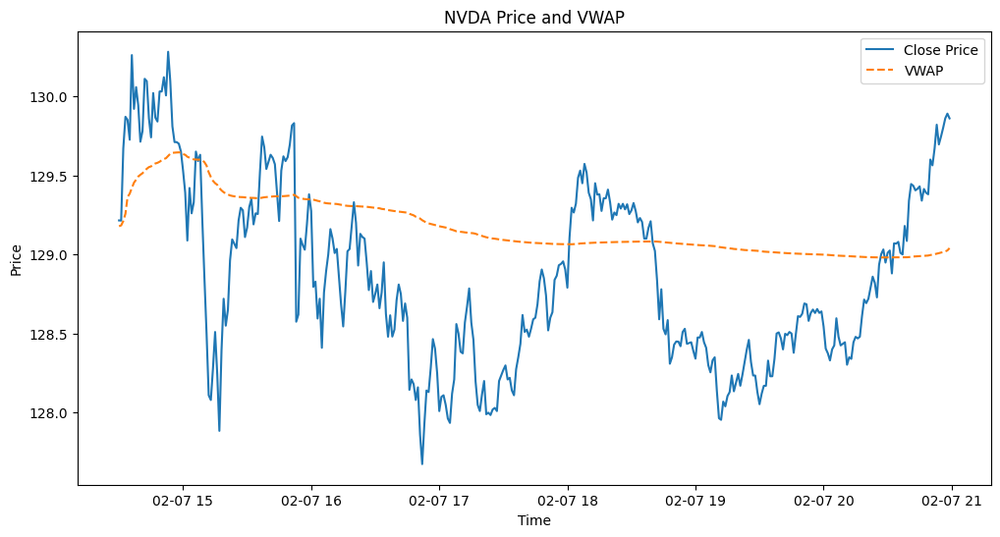

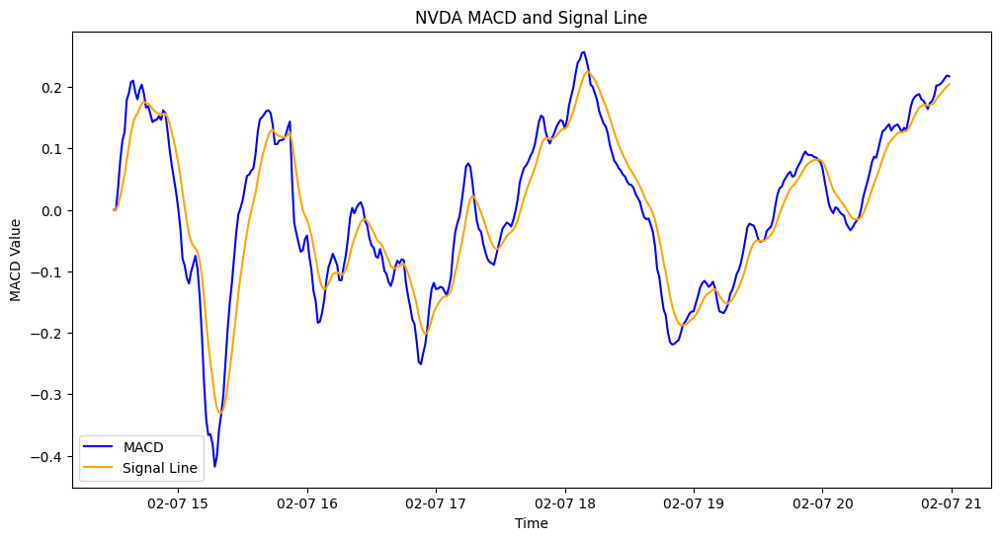

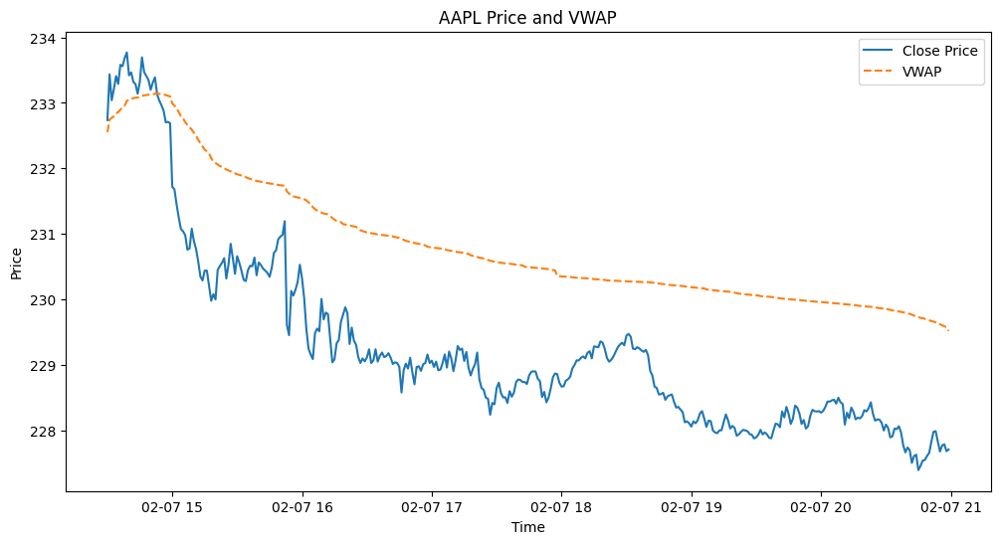

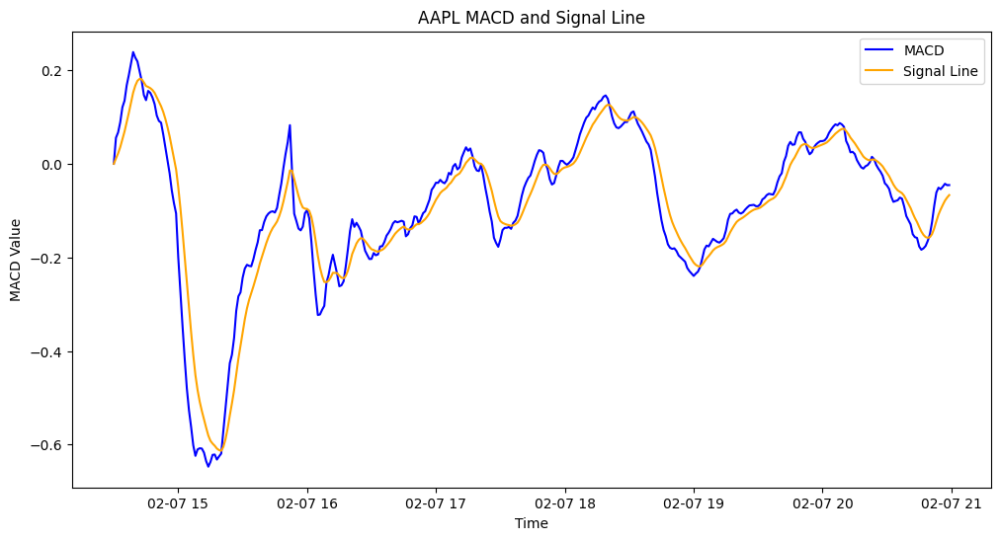

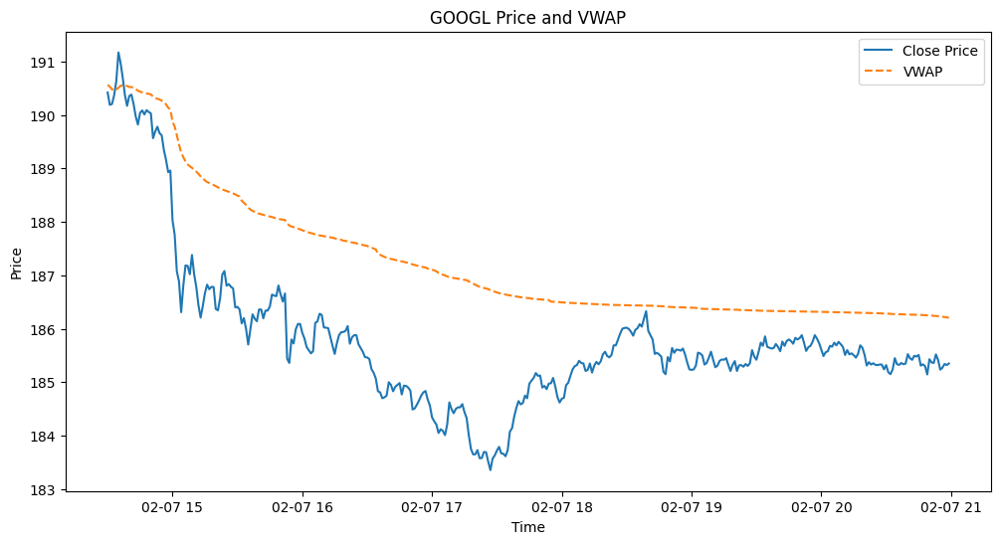

...

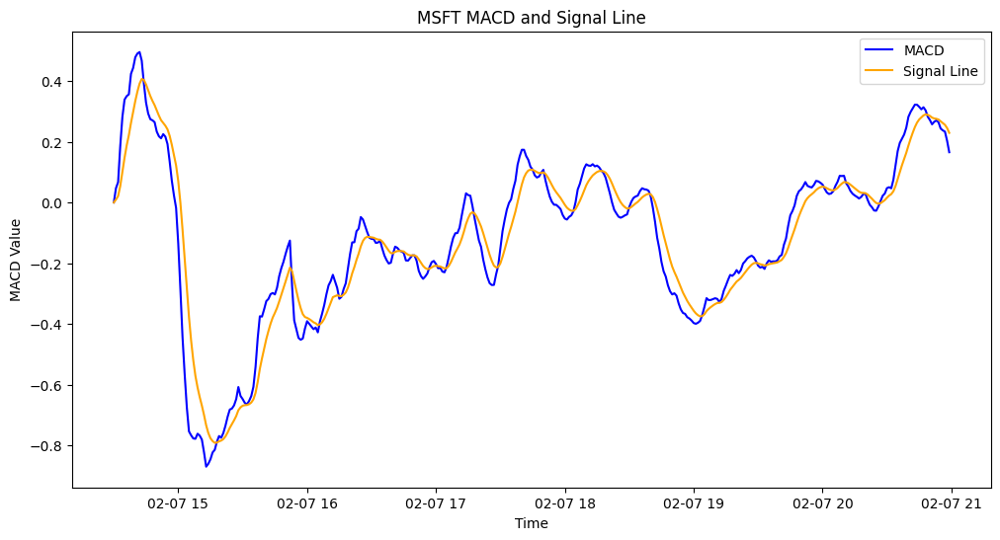

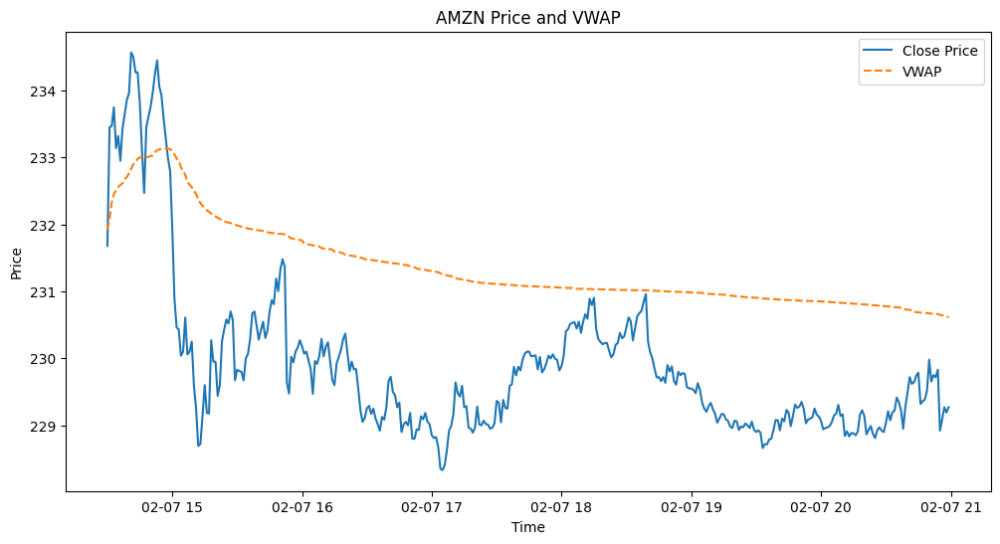

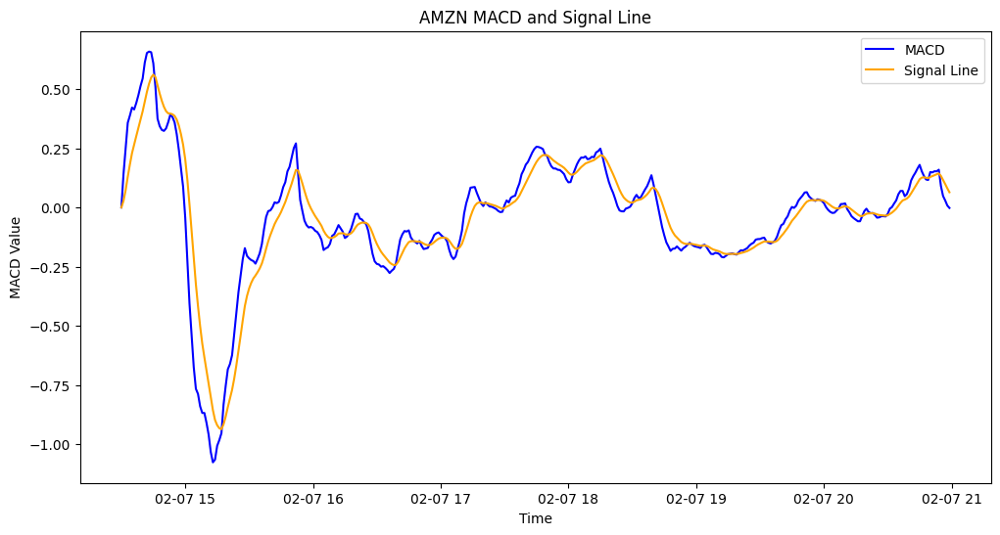

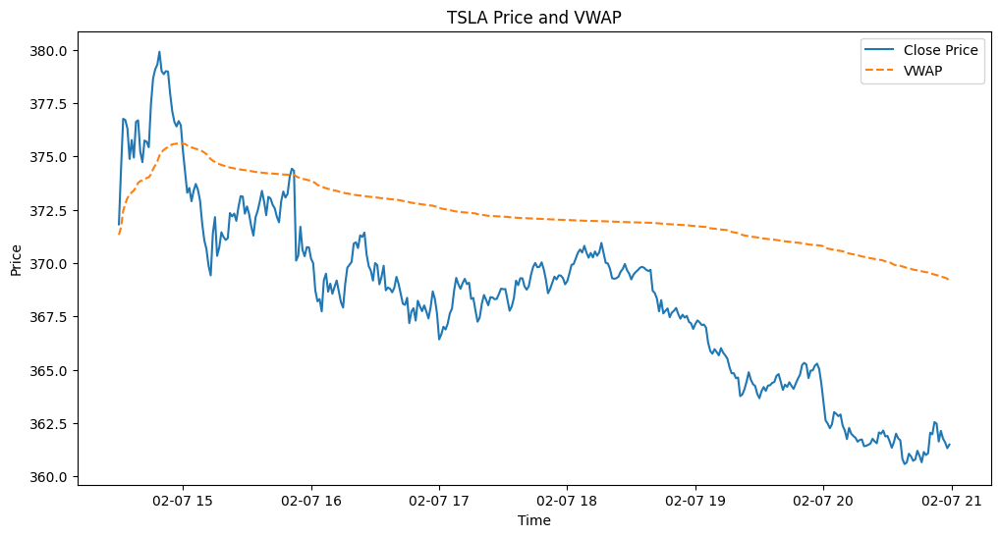

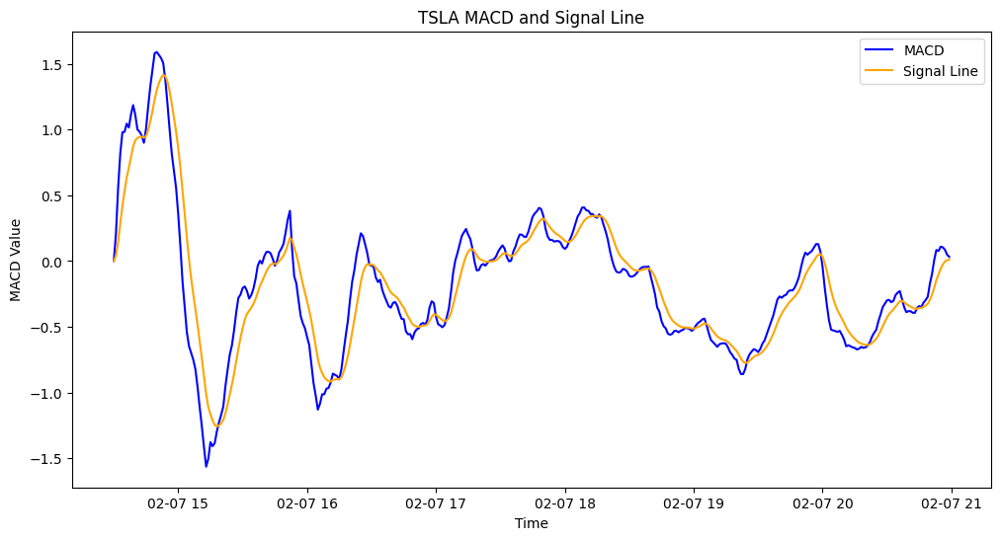

       VWAP Total Return (%)  VWAP Maximum Drawdown (%)  VWAP Sharpe Ratio  \
NVDA                0.499171                  -1.191807           0.174161   
AAPL               -2.160279                  -2.295626          -1.149048   
GOOGL              -2.662531                  -3.710221          -1.175503   
MSFT               -1.600523                  -1.989548          -1.109088   
AMZN               -1.040223                  -1.445614          -0.361047   
TSLA               -2.775613                  -3.021889          -0.741800   

       MACD Total Return (%)  MACD Maximum Drawdown (%)  MACD Sharpe Ratio  
NVDA                0.499171                  -1.191807           0.174161  
AAPL               -2.160279                  -2.295626          -1.149048  
GOOGL              -2.662531                  -3.710221          -1.175503  
MSFT               -1.600523                  -1.989548          -1.109088  
AMZN               -1.040223                  -1.445614          -0.

In [ ]:
# Function to calculate MACD
def calculate_macd(data, ticker, short_window=12, long_window=26, signal_window=9):
    # Accessing data using ticker symbols directly with MultiIndex (e.g., data[('Close', ticker)])
    data[('EMA_short', ticker)] = data[('Close', ticker)].ewm(span=short_window, adjust=False).mean()
    data[('EMA_long', ticker)] = data[('Close', ticker)].ewm(span=long_window, adjust=False).mean()
    data[('MACD', ticker)] = data[('EMA_short', ticker)] - data[('EMA_long', ticker)]
    data[('Signal_Line', ticker)] = data[('MACD', ticker)].ewm(span=signal_window, adjust=False).mean()
    return data

# Initialize a dictionary to store results
results = {}

# Loop through each ticker to fetch data and calculate VWAP
for ticker in tickers:
    # Fetch historical intraday data (commented out for now)
    # data = yf.download(ticker, interval='1m', period='1d')

    # Generate VWAP buy/sell signals for each ticker individually
    data[('VWAP_Signal', ticker)] = 0  # Create a Signal column for each ticker
    # Accessing data using MultiIndex for Close and VWAP
    data[('VWAP_Signal', ticker)][1:] = np.where(data[('Close', ticker)][1:] > data[('VWAP', ticker)][1:], 1, 0)
    data[('VWAP_Position', ticker)] = data[('VWAP_Signal', ticker)].diff()

    # Calculate MACD for the current ticker
    data = calculate_macd(data, ticker)  # Pass the ticker to the function

    # Generate MACD buy/sell signals for each ticker individually
    data[('MACD_Signal', ticker)] = 0
    # Accessing data using MultiIndex for MACD and Signal_Line
    data[('MACD_Signal', ticker)][1:] = np.where(data[('MACD', ticker)][1:] > data[('Signal_Line', ticker)][1:], 1, 0)
    data[('MACD_Position', ticker)] = data[('MACD_Signal', ticker)].diff()

    # Calculate performance metrics for VWAP
    total_return_vwap = (data[('Close', ticker)].iloc[-1] - data[('Close', ticker)].iloc[0]) / data[('Close', ticker)].iloc[0] * 100
    max_drawdown_vwap = (data[('Close', ticker)].min() - data[('Close', ticker)].iloc[0]) / data[('Close', ticker)].iloc[0] * 100
    sharpe_ratio_vwap = (data[('Close', ticker)].pct_change().mean() / data[('Close', ticker)].pct_change().std()) * np.sqrt(252)

    # Calculate performance metrics for MACD
    total_return_macd = (data[('Close', ticker)].iloc[-1] - data[('Close', ticker)].iloc[0]) / data[('Close', ticker)].iloc[0] * 100
    max_drawdown_macd = (data[('Close', ticker)].min() - data[('Close', ticker)].iloc[0]) / data[('Close', ticker)].iloc[0] * 100
    sharpe_ratio_macd = (data[('Close', ticker)].pct_change().mean() / data[('Close', ticker)].pct_change().std()) * np.sqrt(252)

    # Store results
    results[ticker] = {
        'VWAP Total Return (%)': total_return_vwap,
        'VWAP Maximum Drawdown (%)': max_drawdown_vwap,
        'VWAP Sharpe Ratio': sharpe_ratio_vwap,
        'MACD Total Return (%)': total_return_macd,
        'MACD Maximum Drawdown (%)': max_drawdown_macd,
        'MACD Sharpe Ratio': sharpe_ratio_macd
    }

    # Plotting the results for VWAP
    plt.figure(figsize=(12, 6))
    plt.plot(data[('Close', ticker)], label='Close Price')
    plt.plot(data[('VWAP', ticker)], label='VWAP', linestyle='--')  # Assuming you have a VWAP column for each ticker
    plt.title(f'{ticker} Price and VWAP')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

    # Plotting the results for MACD
    plt.figure(figsize=(12, 6))
    plt.plot(data[('MACD', ticker)], label='MACD', color='blue')
    plt.plot(data[('Signal_Line', ticker)], label='Signal Line', color='orange')
    plt.title(f'{ticker} MACD and Signal Line')
    plt.xlabel('Time')
    plt.ylabel('MACD Value')
    plt.legend()
    plt.show()

# Convert results to DataFrame for better visualization
performance_results = pd.DataFrame(results).T
print(performance_results)

These results includes performance metrics for several stocks (NVDA, AAPL, GOOGL, MSFT, AMZN, and TSLA) based on two different trading strategies or indicators: VWAP (Volume Weighted Average Price) and MACD (Moving Average Convergence Divergence). Each metric includes Total Return, Maximum Drawdown, and Sharpe Ratio. This is the discussion of these metrics in detail.

**1. Total Return (%)**
Total return measures the overall percentage change in the value of an investment over a specified period, including both capital gains and any income generated (like dividends).

**NVDA:** A total return of 0.499171% indicates a slight gain, suggesting that the stock has performed relatively well during the period analyzed.

**AAPL:** A total return of -2.160279% indicates a loss, reflecting a challenging period for Apple.

**GOOGL:** A total return of -2.662531% shows a decline, indicating that Alphabet has also faced difficulties.

**MSFT:** A total return of -1.600523% suggests a loss, but not as severe as some others.

**AMZN:** A total return of -1.040223% indicates a slight loss, showing resilience compared to others.

**TSLA:** A total return of -2.775613% indicates the largest loss among the group, suggesting significant challenges for Tesla.

**2. Maximum Drawdown (%)**

Maximum drawdown measures the largest peak-to-trough decline in the value of an investment, reflecting the risk associated with the investment.

**NVDA:** A maximum drawdown of -1.191807% indicates relatively low risk, as the stock has not experienced significant declines from its peak.

**AAPL:** A maximum drawdown of -2.295626% suggests a more considerable decline, indicating higher volatility.

**GOOGL:** A maximum drawdown of -3.710221% shows a significant drop from its peak, indicating increased risk.

**MSFT:** A maximum drawdown of -1.989548% suggests moderate risk, with a notable decline from its peak.

**AMZN:** A maximum drawdown of -1.445614% indicates a moderate level of risk.

**TSLA:** A maximum drawdown of -3.021889% indicates a substantial decline, reflecting high volatility and risk.

**3. Sharpe Ratio**

The Sharpe Ratio measures the risk-adjusted return of an investment. A higher Sharpe Ratio indicates better risk-adjusted performance.

**NVDA:** A Sharpe Ratio of 0.174170 suggests that the stock has provided a positive return relative to its risk, although the ratio is relatively low.

**AAPL:** A Sharpe Ratio of -1.160058 indicates that the stock has underperformed relative to its risk, suggesting poor risk-adjusted returns.

**GOOGL:** A Sharpe Ratio of -1.177475 also indicates underperformance, similar to AAPL.

**MSFT:** A Sharpe Ratio of -1.110499 suggests that Microsoft has not provided adequate returns for the level of risk taken.

**AMZN:** A Sharpe Ratio of -0.361456 indicates that Amazon's returns do not justify the risk taken.

**TSLA** A Sharpe Ratio of -0.741623 suggests that Tesla has also underperformed on a risk-adjusted basis.

**Summary**

**Performance Overview:** NVDA stands out with a positive total return and lower maximum drawdown, indicating a relatively strong performance with lower risk. In contrast, AAPL, GOOGL, MSFT, AMZN, and TSLA show negative returns and higher drawdowns, indicating a more challenging investment environment.


**Risk Assessment:** The maximum drawdown values highlight the risk associated with each stock, with GOOGL and TSLA showing the highest drawdowns, indicating greater volatility.

**Risk-Adjusted Returns:** The Sharpe Ratios for AAPL, GOOGL, MSFT, AMZN, and TSLA are negative, indicating that these stocks have not provided adequate returns for the risks taken. NVDA, while positive, still has a low Sharpe Ratio, suggesting that there is room for improvement in risk-adjusted performance.

Overall, this analysis provides insights into the performance and risk characteristics of these stocks based on VWAP and MACD strategies, helping investors make informed decisions.